## Ex4b: Image Morphology

In [1]:
from skimage import io
from skimage import img_as_ubyte
from skimage.morphology import erosion, dilation, opening, closing, disk 
from skimage.color import rgb2gray
from skimage.filters import gaussian, threshold_otsu
import matplotlib.pyplot as plt
import numpy as np


In [2]:
# From https://scikit-image.org/docs/stable/auto_examples/applications/plot_morphology.html
def plot_comparison(original, filtered, filter_name):
    """
    convenience function to show two images side by side:
    """
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(filter_name)
    ax2.axis('off')
    io.show()

In [3]:
# exercise 1
img_dir = "data/"
img_name = "lego_5.png"
input_img = io.imread(img_dir + img_name)
gray_img = rgb2gray(input_img)

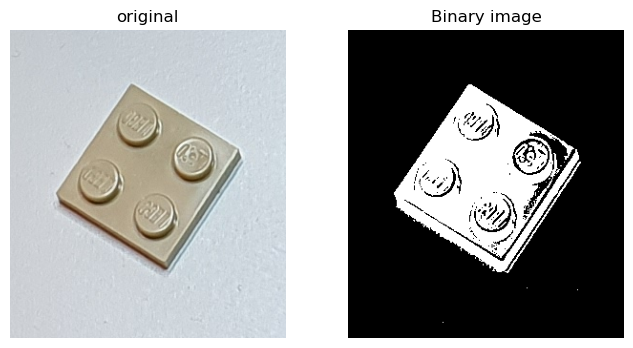

In [4]:
otsu_thres = threshold_otsu(gray_img)
bin_img = gray_img < otsu_thres
plot_comparison(input_img, bin_img, 'Binary image')


In [5]:
# Exercise 2
# create a structuring element, called footprint in scikit-image
# use skimage.morphology.erosion

footprint = disk(2)     # radius 2
# Check the size and shape of the structuring element
print(footprint)

[[0 0 1 0 0]
 [0 1 1 1 0]
 [1 1 1 1 1]
 [0 1 1 1 0]
 [0 0 1 0 0]]


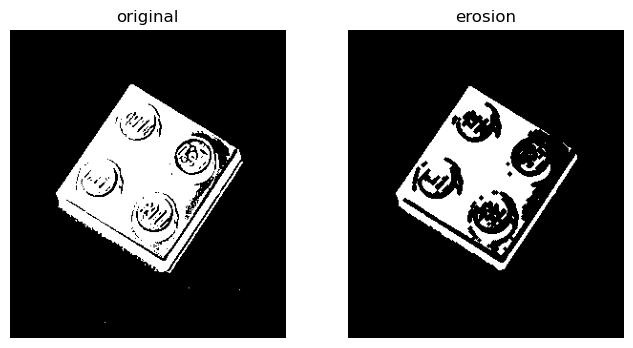

In [6]:
eroded = erosion(bin_img, footprint)
plot_comparison(bin_img, eroded, 'erosion')

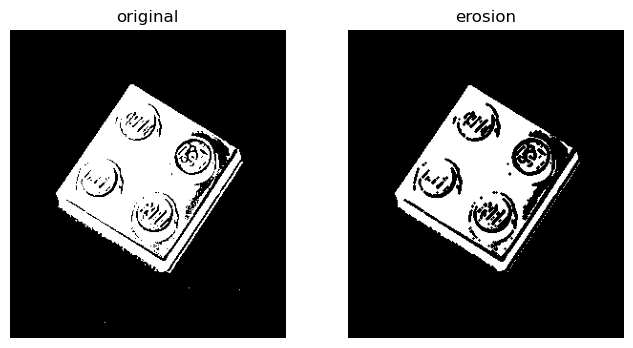

In [7]:
eroded = erosion(bin_img, disk(1))
plot_comparison(bin_img, eroded, 'erosion')

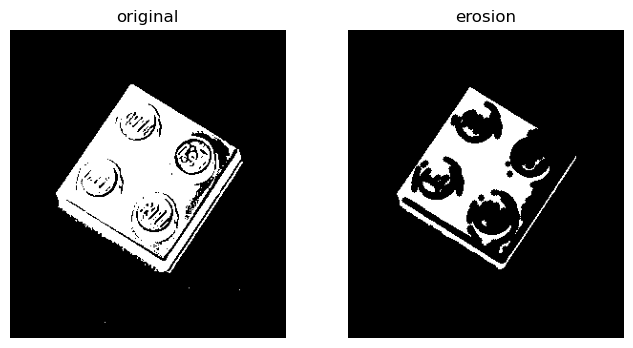

In [8]:
eroded = erosion(bin_img, disk(3))
plot_comparison(bin_img, eroded, 'erosion')

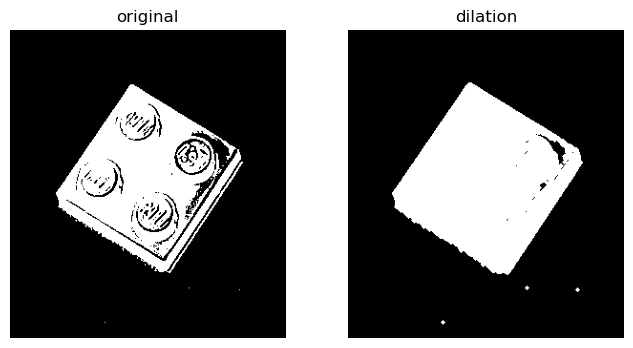

In [9]:
# Exercise 3
# use skimage.morphology.dilation

dilated = dilation(bin_img, disk(2))
plot_comparison(bin_img, dilated, 'dilation')

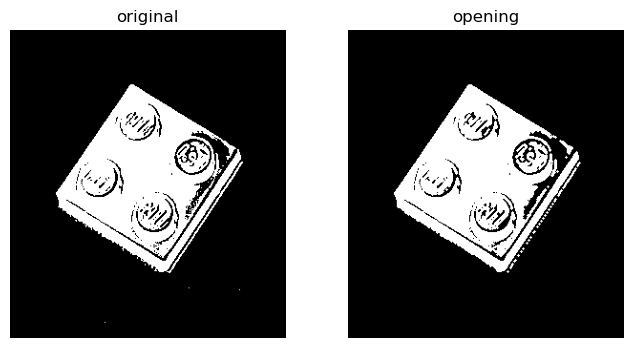

In [10]:
# Exercise 4
# use skimage.morphology.opening

opened = opening(bin_img, disk(1))
plot_comparison(bin_img, opened, 'opening')

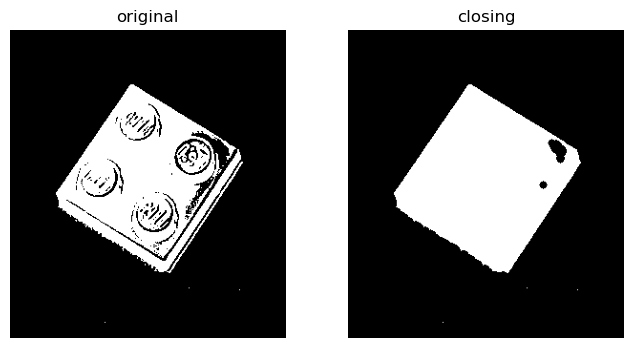

In [11]:
# Exercise 5
# use skimage.morphology.closing

closed = closing(bin_img, disk(4))
plot_comparison(bin_img, closed, 'closing')

In [12]:
# Exercise 6
# useful to compute the outline of an object both to measure the perimeter 
# but also to see if it contains holes or other types of noise

def compute_outline(bin_img):
    """
    Computes the outline of a binary image
    """
    footprint = disk(1)
    dilated = dilation(bin_img, footprint)
    outline = np.logical_xor(dilated, bin_img)
    return outline

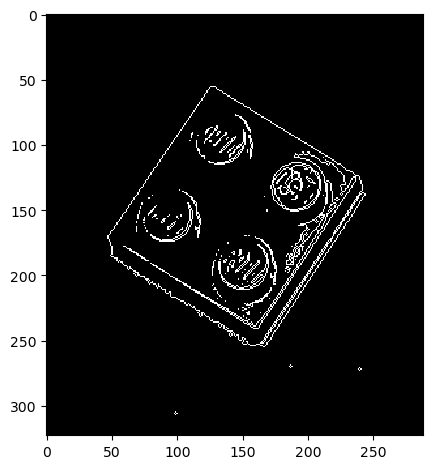

In [13]:
outline_img = compute_outline(bin_img)
io.imshow(outline_img)
io.show()

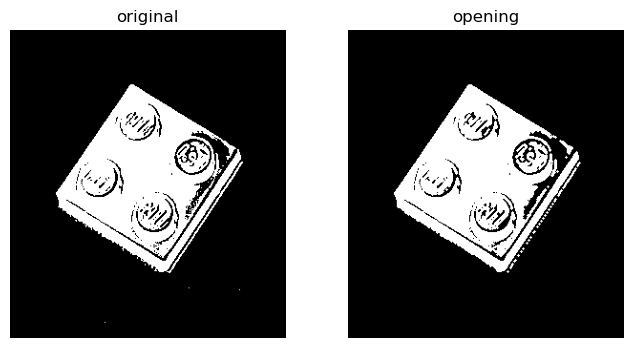

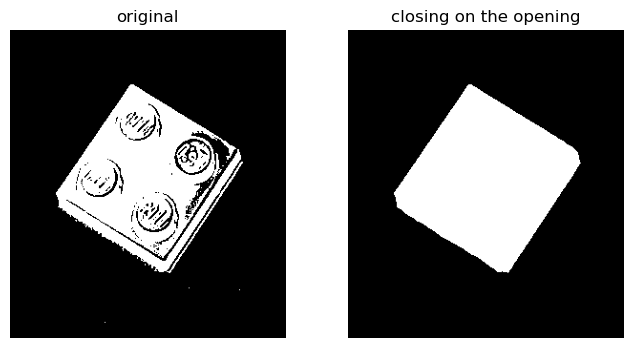

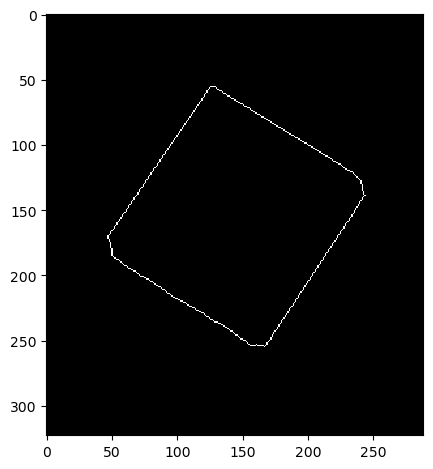

In [14]:
# open, close, compute opening

opened = opening(bin_img, disk(1))
plot_comparison(bin_img, opened, 'opening')

closed = closing(opened, disk(15))
plot_comparison(bin_img, closed, 'closing on the opening')

outline_img = compute_outline(closed)
io.imshow(outline_img)
io.show()

# this sequence tries to create a single blob to represent the lego

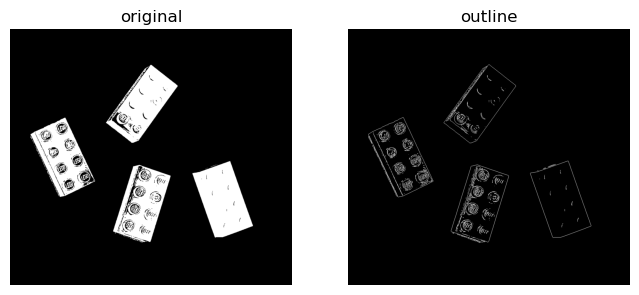

In [15]:
# Exercise 8

img_dir = "data/"
img_name = "lego_7.png"
input_img = io.imread(img_dir + img_name)

# convert to grayscale
gray_img = rgb2gray(input_img)

# use otsu's method to threshold the image into binary
otsu_thres = threshold_otsu(gray_img)
bin_img = gray_img < otsu_thres

# compute the outline image
outline_img = compute_outline(bin_img)
plot_comparison(bin_img, outline_img, 'outline')

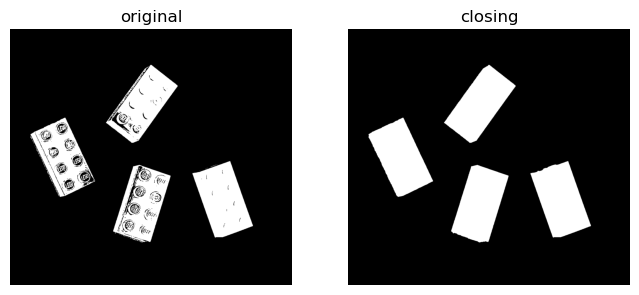

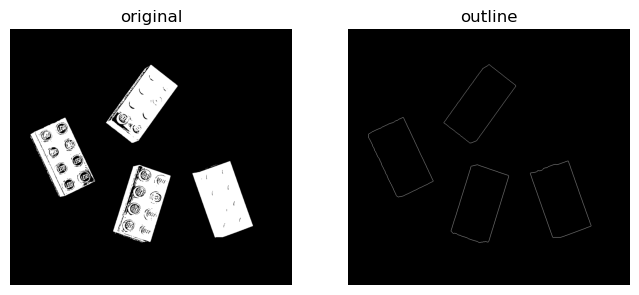

In [16]:
# Exercise 9
# find a way so only the outline of the entire brick is computed. 
# so for each lego brick there should only be one closed curve

closed = closing(bin_img, disk(10))
plot_comparison(bin_img, closed, 'closing')

# compute the outline image
outline_img = compute_outline(closed)
plot_comparison(bin_img, outline_img, 'outline')

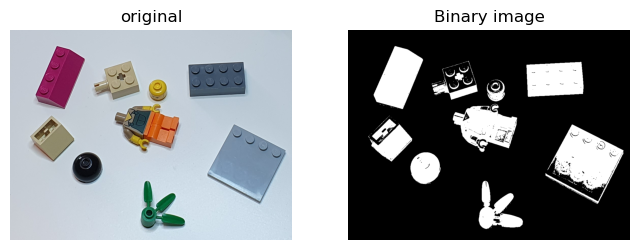

In [17]:
# Exercise 10
# try on another image
img_name = 'lego_3.png'
im_org = io.imread(f'{img_dir}{img_name}')
im_gray = rgb2gray(im_org)
thres = threshold_otsu(im_gray)
bin_img = im_gray < thres
plot_comparison(im_org, bin_img, 'Binary image')


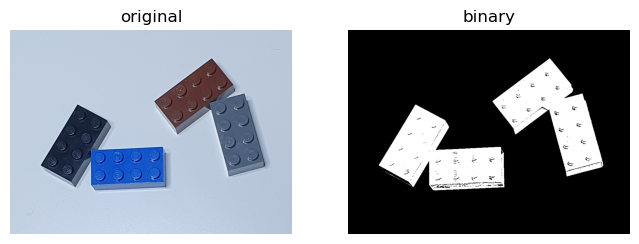

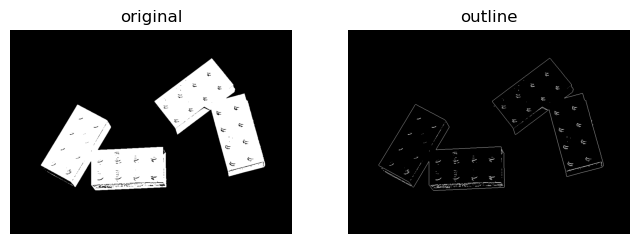

In [18]:
# Exercise 11

img_name = "lego_9.png"
input_img = io.imread(img_dir + img_name)

# convert to grayscale
gray_img = rgb2gray(input_img)

# use otsu's method to threshold the image into binary
otsu_thres = threshold_otsu(gray_img)
bin_img = gray_img < otsu_thres
plot_comparison(input_img, bin_img, 'binary')

# compute the outline image
outline_img = compute_outline(bin_img)
plot_comparison(bin_img, outline_img, 'outline')

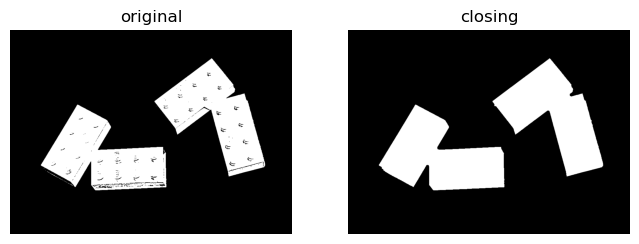

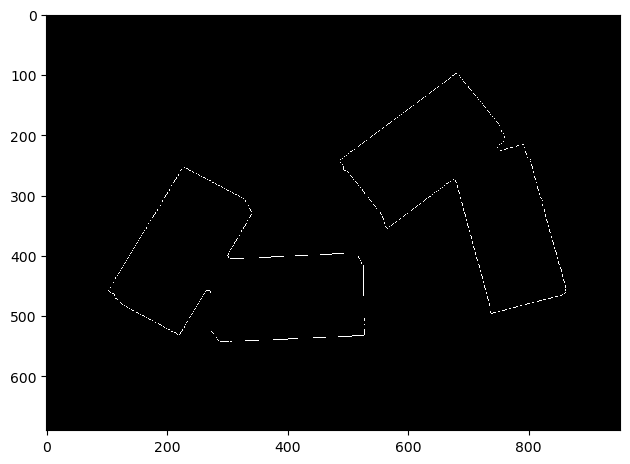

In [19]:
# Exercise 12
# remove noise inside the lego bricks

closed = closing(bin_img, disk(5))
plot_comparison(bin_img, closed, 'closing')

# compute the outline image
outline_img = compute_outline(closed)
io.imshow(outline_img)
io.show()

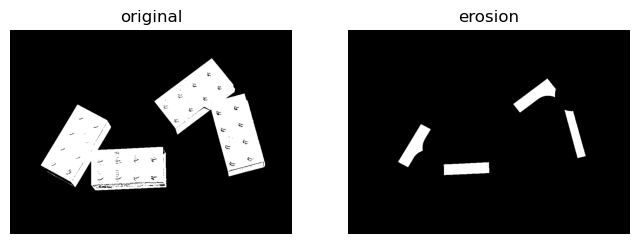

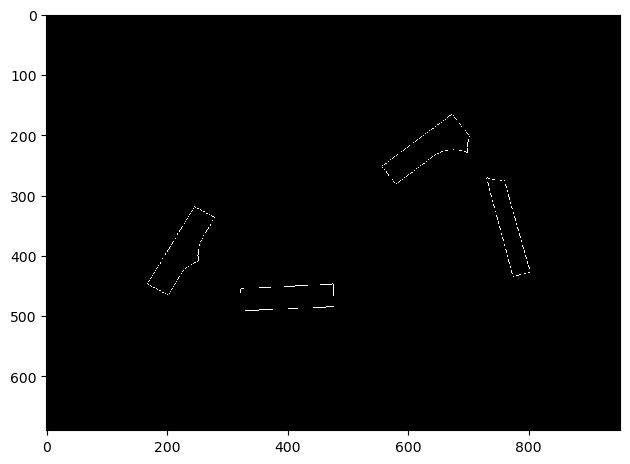

In [20]:
# Exercise 13
# separate the objects using erosion

eroded = erosion(closed, disk(50))
plot_comparison(bin_img, eroded, 'erosion')

# compute the outline image
outline_img = compute_outline(eroded)
io.imshow(outline_img)
io.show()

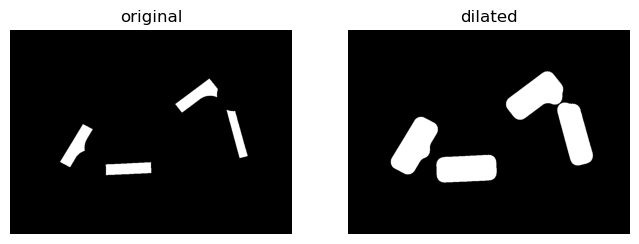

In [21]:
# Exercise 14
# use dilate to enlarge the objects and restore original size 
# before they start touching

dilated = dilation(eroded, disk(25))
plot_comparison(eroded, dilated, 'dilated')

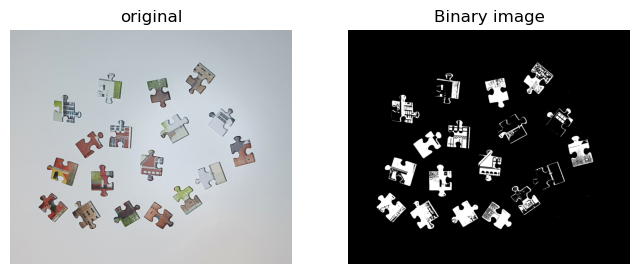

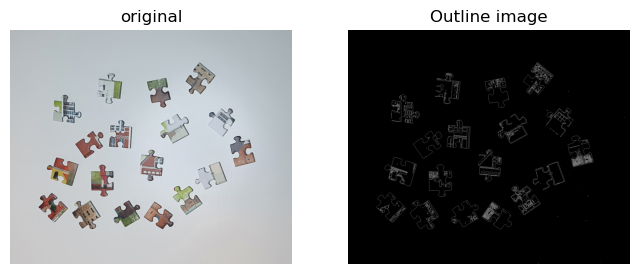

In [22]:
# Exercise 15
# compute binary photo of puzzle photo
img_name = 'puzzle_pieces.png'
img_org = io.imread(img_dir + img_name)
img_gray = rgb2gray(img_org)

thres = threshold_otsu(img_gray)
bin_img = img_gray < thres
plot_comparison(img_org, bin_img, 'Binary image')

outline_img = compute_outline(bin_img)
plot_comparison(img_org, outline_img, 'Outline image')

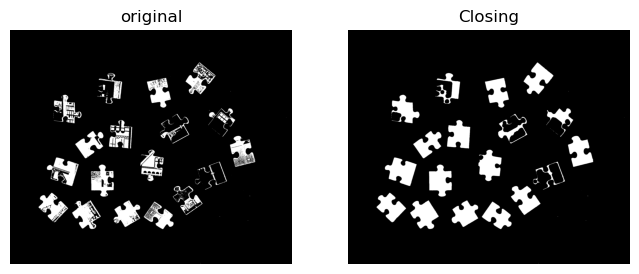

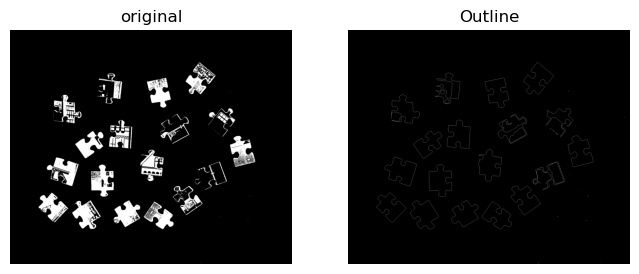

In [23]:
closed = closing(bin_img, disk(15))
plot_comparison(bin_img, closed, 'Closing')

outline = compute_outline(closed)
plot_comparison(bin_img, outline, 'Outline')

## Ex5: BLOB Analysis / Connected component analysis and object classification 

In [24]:
import math
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import threshold_otsu
from skimage.color import label2rgb, rgb2gray
from skimage import io, color, morphology, segmentation, measure
from skimage.util import img_as_float, img_as_ubyte

In [25]:
def show_comparison(original, modified, modified_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(modified, cmap=plt.cm.gray)
    ax2.set_title(modified_name)
    ax2.axis('off')
    io.show()

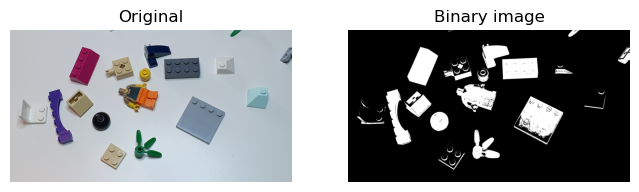

In [26]:
# exercise 1: show binary image
img_dir = "data/"
img_name = "lego_4_small.png"
input_img = io.imread(img_dir + img_name)
gray_img = rgb2gray(input_img)
otsu_thres = threshold_otsu(gray_img)
bin_img = gray_img < otsu_thres
show_comparison(input_img, bin_img, 'Binary image')

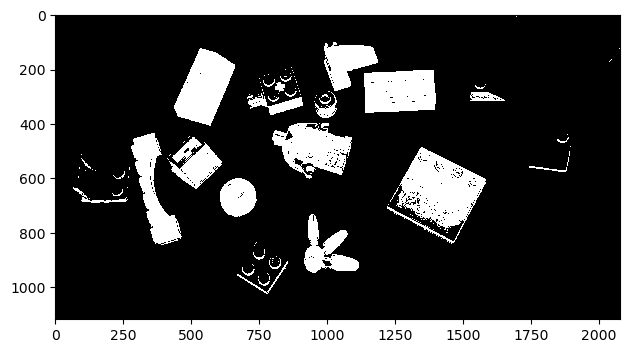

In [27]:
# exercise 2: remove border blobs
bin_img = segmentation.clear_border(bin_img)
io.imshow(bin_img)
io.show()

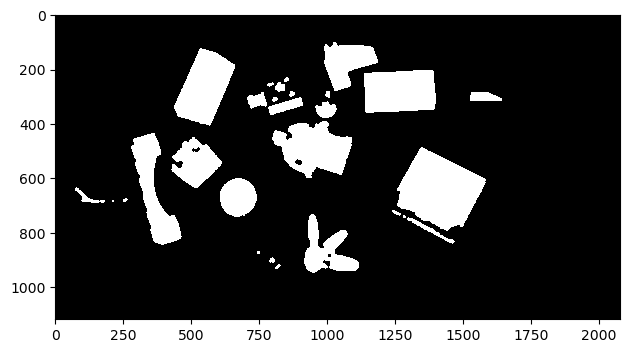

In [28]:
# exercise 3: cleaning use morphological operations
close_img = morphology.closing(bin_img, morphology.disk(5))
open_img = morphology.opening(close_img, morphology.disk(5))
io.imshow(open_img)
io.show()

In [29]:
# exercise 4: find labels

label_img = measure.label(open_img)
# labeled array, where all connected regions are assigned the same int value

n_labels = label_img.max()
print(f"Number of labels: {n_labels}")

Number of labels: 29


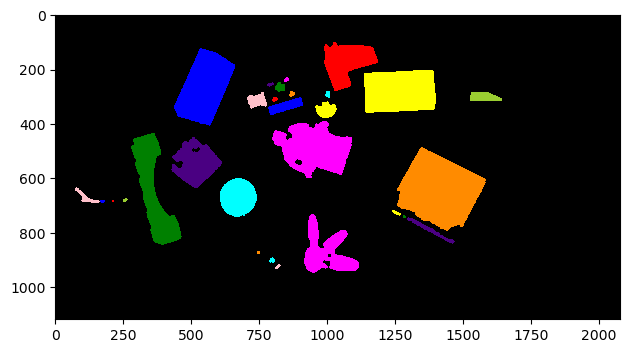

In [30]:
# exercise 5: visualise found labels

rgblabel_img = label2rgb(label_img)
# The result of blending a cycling colormap
# for each distinct value in label with the image

io.imshow(rgblabel_img)
io.show()

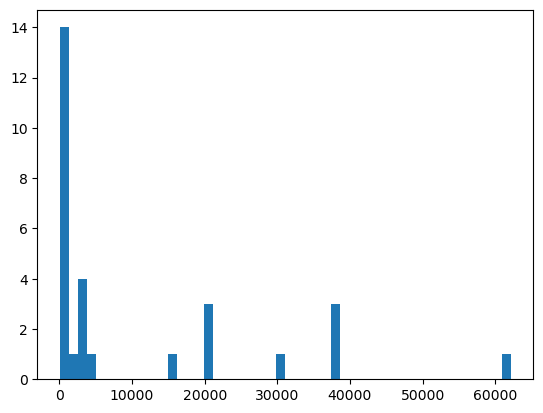

In [31]:
# exercise 6: compute blob features
region_props = measure.regionprops(label_img)
areas = np.array([prop.area for prop in region_props])
plt.hist(areas, bins=50)
plt.show()

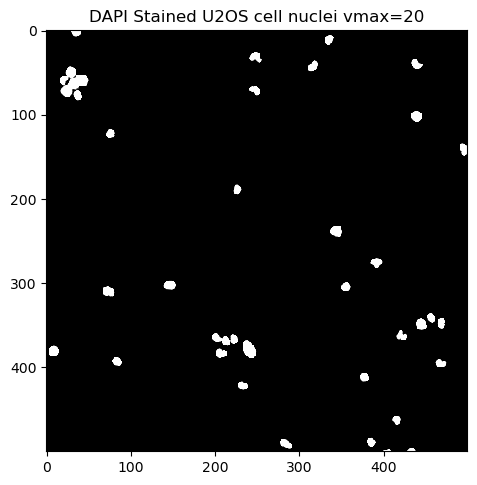

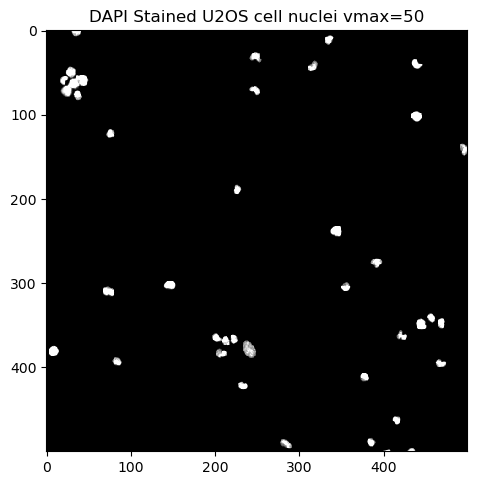

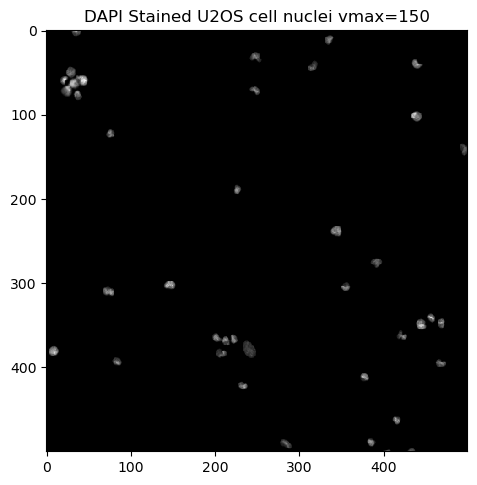

In [32]:
# exercise 7: cell counting
img_org = io.imread(img_dir + 'Sample E2 - U2OS DAPI channel.tiff')
# slice to extract smaller image
img_small = img_org[700:1200, 900:1400]
img_gray = img_as_ubyte(img_small)

# adjust vmin vmax to make cell nuclei most visible
for vmax in [20,50,150]:
    io.imshow(img_gray, vmin=10, vmax=vmax)
    plt.title(f'DAPI Stained U2OS cell nuclei vmax={vmax}')
    io.show()

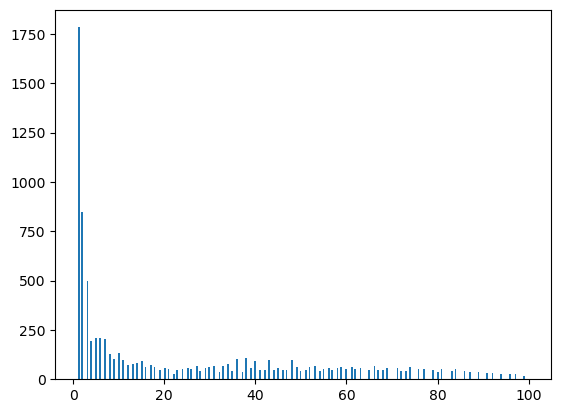

In [33]:
# avoid bin with value 0 due to the very large number of background pixels
plt.hist(img_gray.ravel(), bins=256, range=(1, 100))
io.show()

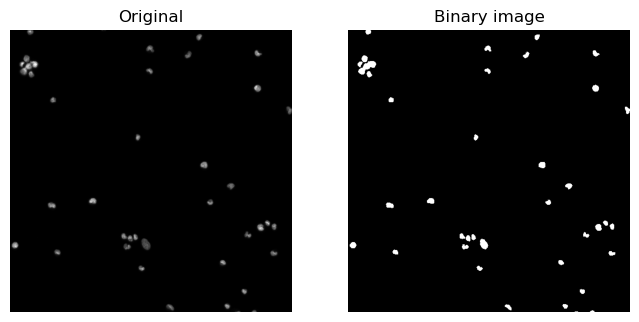

In [34]:
# exercies 8: threshold selection
otsu_thres = threshold_otsu(img_gray)
bin_img = img_gray > otsu_thres
show_comparison(img_gray, bin_img, 'Binary image')

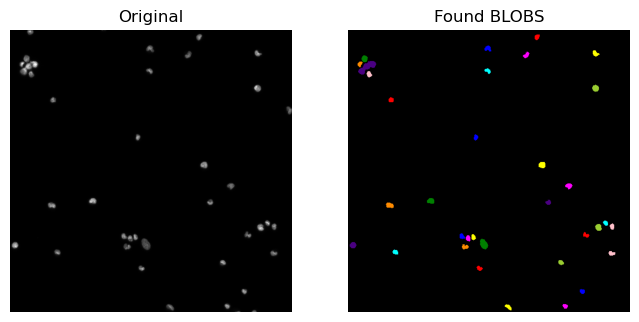

In [35]:
# exercise 9: remove border blobs, label2rgb
img_c_b = segmentation.clear_border(bin_img)
label_img = measure.label(img_c_b)
image_label_overlay = label2rgb(label_img)
show_comparison(img_small, image_label_overlay, 'Found BLOBS')

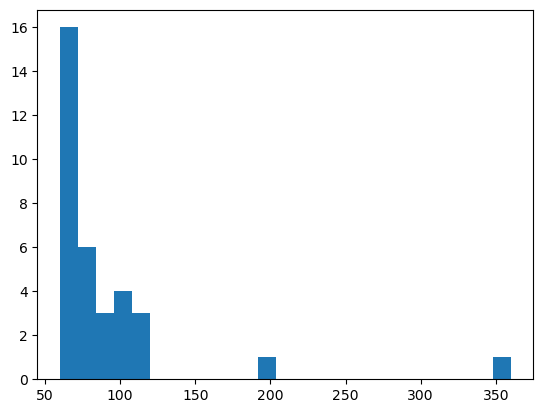

In [36]:
# exercise 10: blob features
region_props = measure.regionprops(label_img)
areas = np.array([prop.area for prop in region_props])

plt.hist(areas, bins=25)
plt.show()

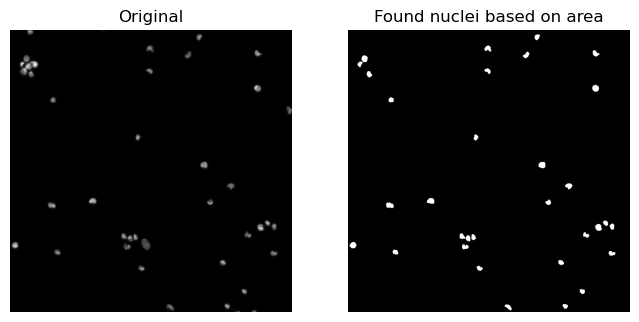

In [37]:
# exercise 11: blob classification by area
min_area = min(areas)
max_area = 150

# Create a copy of the label_img
label_img_filter = label_img
for region in region_props:
    # Find the areas that do not fit our criteria
    if region.area > max_area or region.area < min_area:
        # set the pixels in the invalid areas to background
        for cords in region.coords:
            label_img_filter[cords[0], cords[1]] = 0
            
# Create binary image from the filtered label image
i_area = label_img_filter > 0
show_comparison(img_small, i_area, 'Found nuclei based on area')

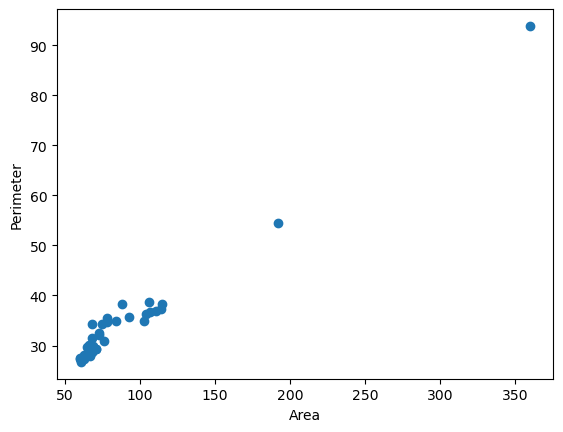

In [38]:
# exercise 12: feature space
perimeters = np.array([prop.perimeter for prop in region_props])

plt.scatter(areas, perimeters)
plt.xlabel("Area")
plt.ylabel('Perimeter')
plt.show()

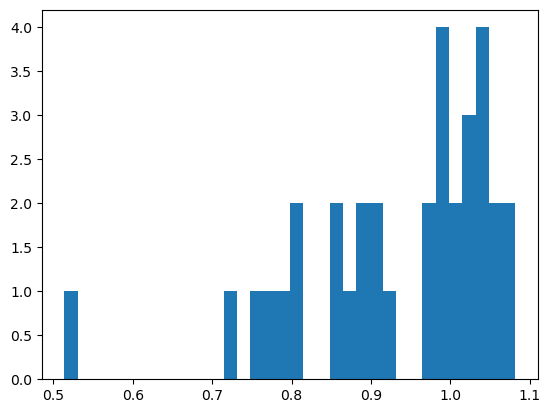

In [39]:
# exercise 13: BLOB circularity

def circularity(area, perimeter):
    f_circ = 4*math.pi*area/(perimeter**2)
    return f_circ
    
circ = [circularity(areas[i], perimeters[i]) for i in range(len(areas))]
plt.hist(circ, bins=len(circ))
plt.show()

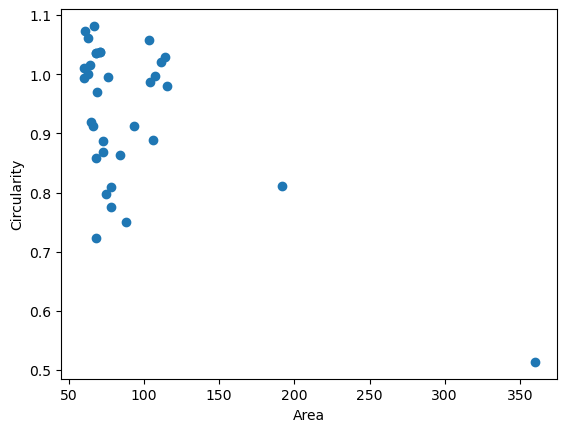

In [40]:
# Exercise 14 
plt.scatter(areas, circ)
plt.xlabel("Area")
plt.ylabel("Circularity")
plt.show()

Objects:  28


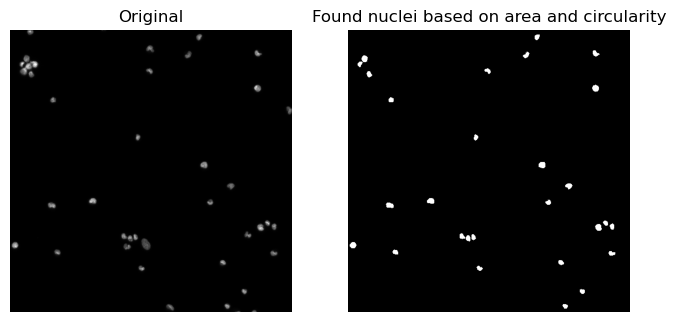

In [41]:
# Select cells with an appropriate range of accepted circularity and area
# Show them in an image.
min_area = 10
max_area = 150
label_img_filter = label_img
num_objects = 0
for region in region_props:
    p = region.perimeter
    a = region.area
    circ = circularity(a, p)
    if circ < 0.8 or a < min_area or a > max_area:
        for cords in region.coords:
            label_img_filter[cords[0], cords[1]] = 0
    else:
        num_objects += 1

print("Objects: ", num_objects)
i_circ = label_img_filter > 0
show_comparison(img_small, i_circ, 'Found nuclei based on area and circularity')

## Ex6:  Pixel classification and object segmentation

In [1]:
from skimage import io, color
from skimage.morphology import binary_closing, binary_opening
from skimage.morphology import disk
import matplotlib.pyplot as plt
import numpy as np
from skimage import measure
from skimage.color import label2rgb
import pydicom as dicom
from scipy.stats import norm
from scipy.spatial import distance


def show_comparison(original, modified, modified_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap="gray", vmin=-200, vmax=500)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(modified)
    ax2.set_title(modified_name)
    ax2.axis('off')
    io.show()

In [2]:
in_dir = "data/"
ct = dicom.read_file(in_dir + 'Training.dcm')
img = ct.pixel_array
print(img.shape)
print(img.dtype)

(512, 512)
int16


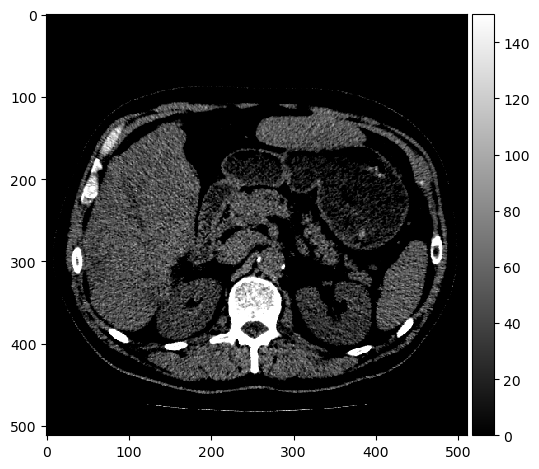

In [3]:
# Exercise 1: adjust image contrast
io.imshow(img, vmin=0, vmax=150, cmap='gray')
io.show()

In [4]:
# Exercise 2: use the annotated images (boolean masks)
spleen_roi = io.imread(in_dir + 'SpleenROI.png')
# convert to boolean image
spleen_mask = spleen_roi > 0
spleen_values = img[spleen_mask]
mu_spleen = np.mean(spleen_values)
std_spleen = np.std(spleen_values)
print(spleen_values.shape)
print(mu_spleen)
print(std_spleen)

(2230,)
49.48026905829597
14.9970794143059


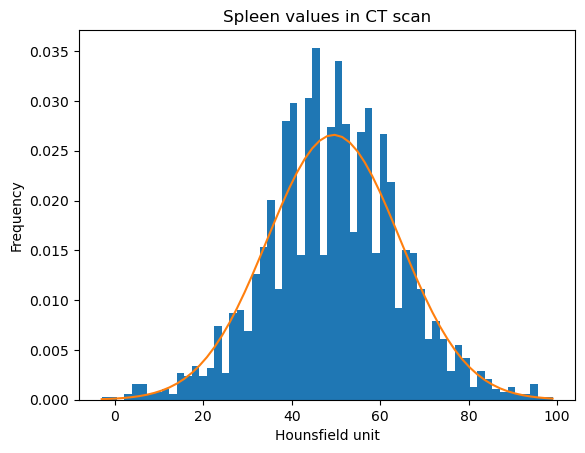

In [5]:
# Exercise 3
n, bins, patches = plt.hist(spleen_values, 60, density=1)
pdf_spleen = norm.pdf(bins, mu_spleen, std_spleen)
plt.plot(bins, pdf_spleen)
plt.xlabel('Hounsfield unit')
plt.ylabel('Frequency')
plt.title('Spleen values in CT scan')
plt.show()

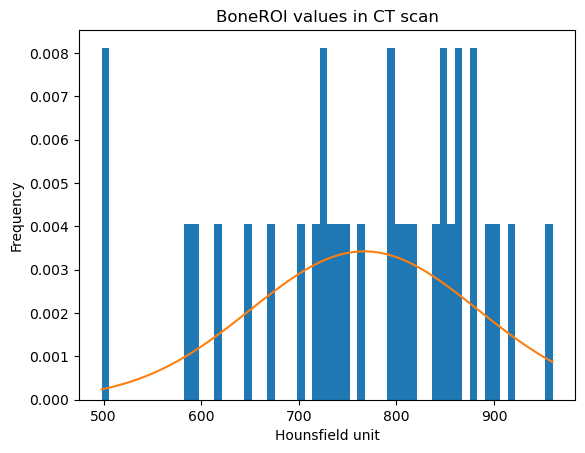

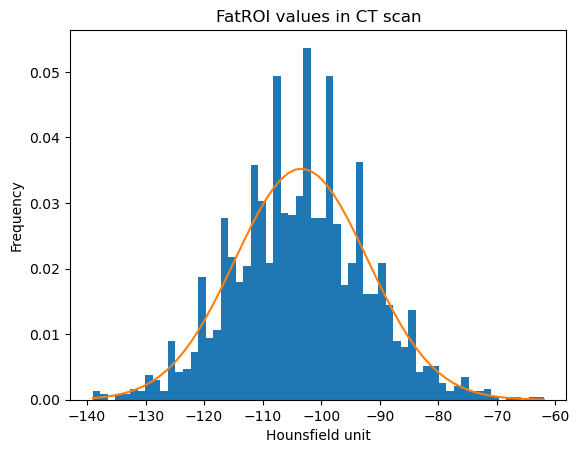

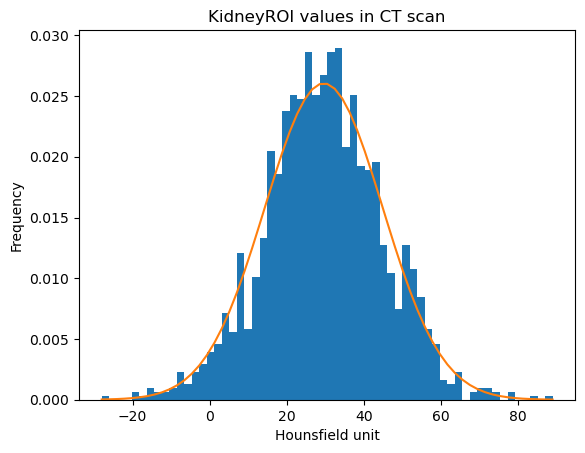

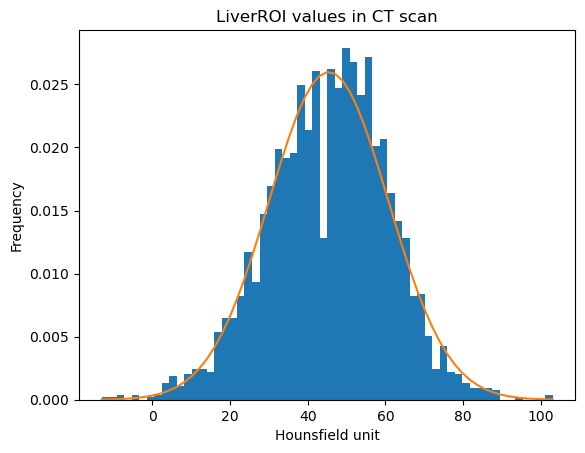

In [6]:
# Exercise 4: plot for other organsO
ROI = ['BoneROI', 'FatROI', 'KidneyROI', 'LiverROI']
mu_organs = []
std_organs = []
for roi in ROI:
    roi_img = io.imread(in_dir + roi + '.png')
    organ_mask = roi_img > 0
    organ_values = img[organ_mask]
    mu_organ = np.mean(organ_values)
    std_organ = np.std(organ_values)
    mu_organs.append(mu_organ)
    std_organs.append(std_organ)
    n, bins, patches = plt.hist(organ_values, 60, density=1)
    pdf_spleen = norm.pdf(bins, mu_organ, std_organ)
    plt.plot(bins, pdf_spleen)
    plt.xlabel('Hounsfield unit')
    plt.ylabel('Frequency')
    plt.title(roi + ' values in CT scan')
    plt.show()
    

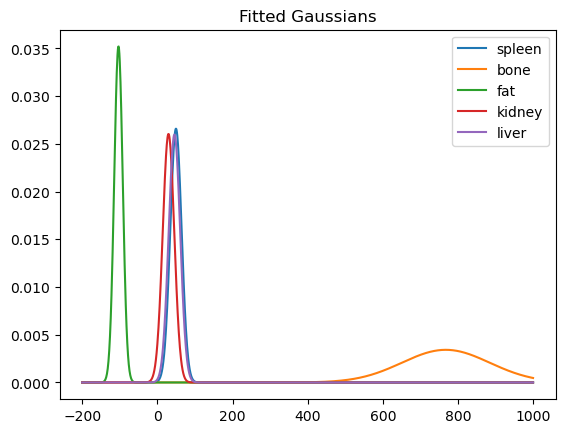

In [7]:
# Exercise 5 : fitted gaussians of the 5 organs
# Hounsfield unit limits of the plot
# ROI = ['BoneROI', 'FatROI', 'KidneyROI', 'LiverROI']
min_hu = -200
max_hu = 1000
mu_bone = mu_organs[0]
std_bone = std_organs[0]
hu_range = np.arange(min_hu, max_hu, 1.0)
pdf_spleen = norm.pdf(hu_range, mu_spleen, std_spleen)
pdf_bone = norm.pdf(hu_range, mu_organs[0], std_organs[0])
pdf_fat = norm.pdf(hu_range, mu_organs[1], std_organs[1])
pdf_kidney = norm.pdf(hu_range, mu_organs[2], std_organs[2])
pdf_liver = norm.pdf(hu_range, mu_organs[3], std_organs[3])
plt.plot(hu_range, pdf_spleen, label="spleen")
plt.plot(hu_range, pdf_bone, label="bone")
plt.plot(hu_range, pdf_fat,  label="fat")
plt.plot(hu_range, pdf_kidney, label="kidney")
plt.plot(hu_range, pdf_liver, label="liver")
plt.title("Fitted Gaussians")
plt.legend()
plt.show()

### Combine plot of organs. Adjust hu_range if needed
# min_hu = -200
# max_hu = 1000
# hu_range = np.arange(min_hu, max_hu, 1.0)
# for i in range(len(ROI)):
#     pdf_organ = norm.pdf(hu_range,mu_organs[i],std_organs[i])
#     plt.plot(hu_range,pdf_organ,label=ROI[i])
# plt.title("Combined fitted Gaussians")
# plt.legend()
# plt.show()

# liver, spleen, and kidney are very hard to separate.
# Thus, these 3 organs can be combined into one class 'soft tissues'

## Minimum distance classifier

In [8]:
# Exercise 7: compute class ranges defining fat, soft tissue, bone

soft_tissues = ['SpleenROI', 'KidneyROI', 'LiverROI']
soft_mask = np.zeros(img.shape, dtype = bool)

for organ in soft_tissues:
    roi_img = io.imread(in_dir + organ + '.png')
    organ_mask = roi_img > 0
    soft_mask = organ_mask | soft_mask

soft_values = img[soft_mask]
mu_soft = np.mean(soft_values)
std_soft = np.std(soft_values)

# take threshold as midpoint between 2 class value averages
t_background = -200
t_fat_soft = (mu_soft + mu_organs[1])/ 2
t_soft_bone = (mu_soft + mu_organs[0])/ 2

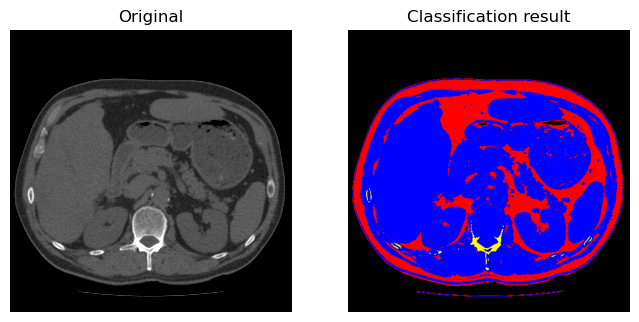

In [9]:
# Exercise 8: create class images
fat_img = (img > t_background) & (img <= t_fat_soft)
soft_img = (img > t_fat_soft) & (img <= t_soft_bone)
bone_img = img > t_soft_bone

label_img = fat_img + 2 * soft_img + 3 * bone_img
image_label_overlay = label2rgb(label_img)
show_comparison(img, image_label_overlay, 'Classification result')

## Parametric classifier

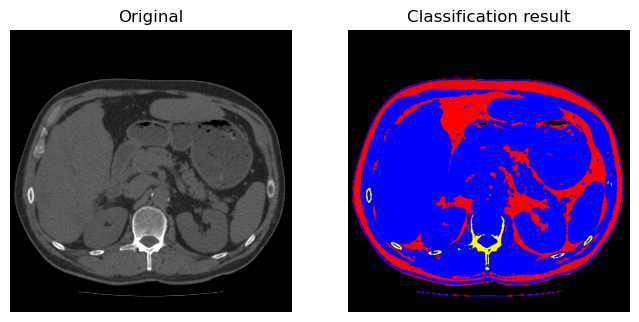

In [10]:
# Exercise 9: manually inspect class ranges
t_background = -200
t_fat_soft = -50
t_soft_bone = 300

# Exercise 10: visualise classification result
fat_img = (img > t_background) & (img <= t_fat_soft)
soft_img = (img > t_fat_soft) & (img <= t_soft_bone)
bone_img = img > t_soft_bone

label_img = fat_img + 2 * soft_img + 3 * bone_img
image_label_overlay = label2rgb(label_img)
show_comparison(img, image_label_overlay, 'Classification result')

For value 141 the class is bone
For value -44 the class is soft tissue


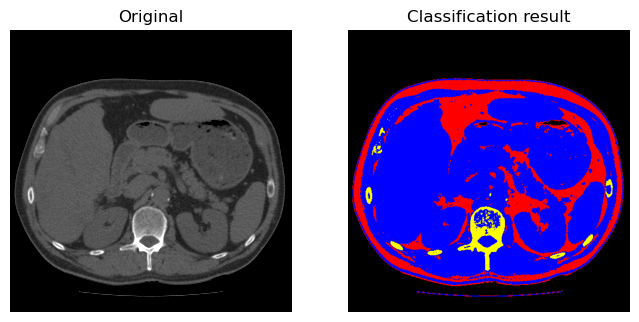

In [11]:
# Exercise 11: use norm.pdf to find optimal class ranges

# find the point when the pdf for bone > pdf soft tissue
for test_value in range(100,500):
    if norm.pdf(test_value, mu_soft, std_soft) < norm.pdf(test_value, mu_bone, std_bone):
        print(f"For value {test_value} the class is bone")
        break
        
# find the point when the pdf for soft tissue > pdf fat
for test_value in range(-100,0):
    if norm.pdf(test_value, mu_organs[1], std_organs[1]) < norm.pdf(test_value, mu_soft, std_soft):
        print(f"For value {test_value} the class is soft tissue")
        break

# visualise classification result
t_background = -200
t_fat_soft = -44
t_soft_bone = 141

fat_img = (img > t_background) & (img <= t_fat_soft)
soft_img = (img > t_fat_soft) & (img <= t_soft_bone)
bone_img = img > t_soft_bone

label_img = fat_img + 2 * soft_img + 3 * bone_img
image_label_overlay = label2rgb(label_img)
show_comparison(img, image_label_overlay, 'Classification result')

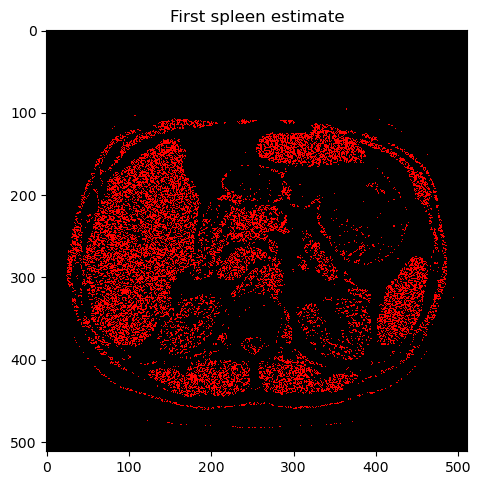

In [12]:
# Exercise 11:
t_1 = 40   # from exercise 3
t_2 = 60   # from exercise 3
spleen_estimate = (img > t_1) & (img < t_2)
spleen_label_colour = color.label2rgb(spleen_estimate)
io.imshow(spleen_label_colour)
plt.title("First spleen estimate")
io.show()

None


C:\Users\yufan\anaconda3\envs\course02502\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


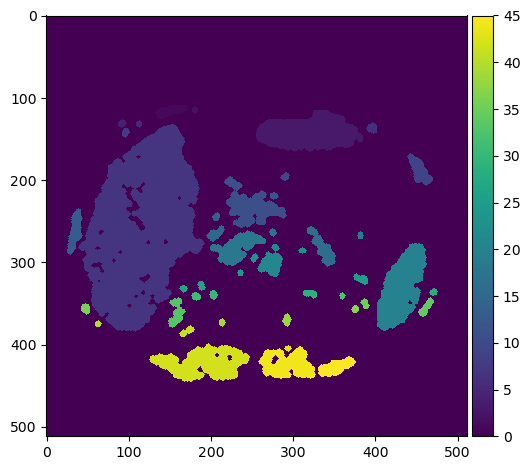

In [13]:
# Exercise 12: use morph operations to separate spleen 
# from other organs and close holes
footprint = disk(2)
closed = binary_closing(spleen_estimate, footprint)

footprint = disk(4)
opened = binary_opening(closed, footprint)

label_img = measure.label(opened)
region_props = measure.regionprops(label_img)
areas = []
for region in region_props:
    areas.append(region.area)
print(areas.sort())

io.imshow(label_img)
io.show()

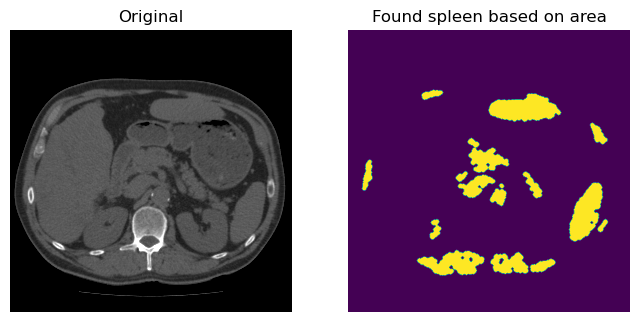

In [14]:
# Exercise 13: validate success of separated spleen

min_area = 190
max_area = 5000

# Create a copy of the label_img
label_img_filter = label_img.copy()
for region in region_props:
    # Find the areas that do not fit our criteria
    if region.area > max_area or region.area < min_area:
        # set the pixels in the invalid areas to background
        for cords in region.coords:
            label_img_filter[cords[0], cords[1]] = 0
# Create binary image from the filtered label image
i_area = label_img_filter > 0
show_comparison(img, i_area, 'Found spleen based on area')

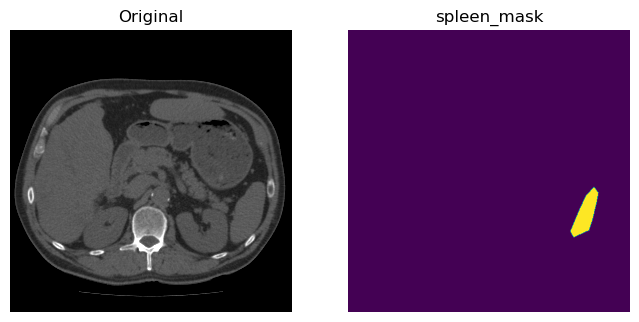

In [15]:
# expected correct answer
show_comparison(img, spleen_mask, 'spleen_mask')

In [16]:
# Exercise 14: Extend method to several BLOB features
# Exercise 14
min_area = 2000
max_area = 10000 
min_ecc = 0.90
max_perimeter = 350 

# Create a copy of the label_img
label_img_filter = label_img.copy()
region_props = measure.regionprops(label_img)
for region in region_props:
	# Find the areas that do not fit our criteria
	if region.area > max_area or region.area < min_area or region.eccentricity < min_ecc or region.perimeter > max_perimeter:
		# set the pixels in the invalid areas to background
		for cords in region.coords:
			label_img_filter[cords[0], cords[1]] = 0
# Create binary image from the filtered label image
i_area = label_img_filter > 0
show_comparison(img, i_area, 'Found spleen based on area')

In [17]:
# Exercise 15: create fx that takes in CT img and returns bin img
def spleen_finder(ct_image, max_area = 10000, min_area = 1000, min_ecc = 0.9, max_perimeter = 350, min_perimeter = 250): 
    # thresholding 
    t_1, t_2 = 20, 80
    spleen_estimate = (ct_image > t_1) & (ct_image < t_2)
    
    #  morphological operations 
    fp1, fp2 = disk(2), disk(4)
    closed = binary_closing(spleen_estimate, fp1)
    opened = binary_opening(closed, fp2)

    # image to label
    label_img = measure.label(opened)
    label_img_filter = label_img.copy()

    region_props = measure.regionprops(label_img)
    for region in region_props:
        # Find the areas that do not fit our criteria
        if region.area > max_area or region.area < min_area or region.eccentricity < min_ecc or region.perimeter > max_perimeter or region.perimeter < min_perimeter:
            # set the pixels in the invalid areas to background
            for cords in region.coords:
                label_img_filter[cords[0], cords[1]] = 0
    # Create binary image from the filtered label image
    return label_img_filter > 0

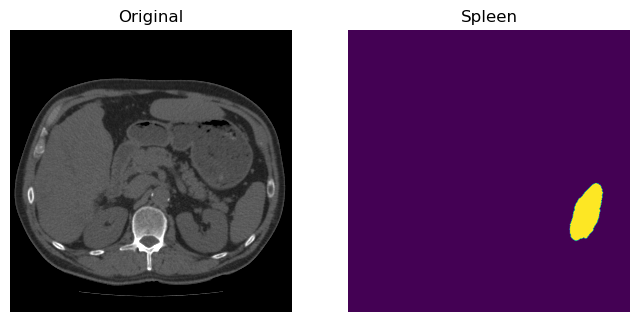

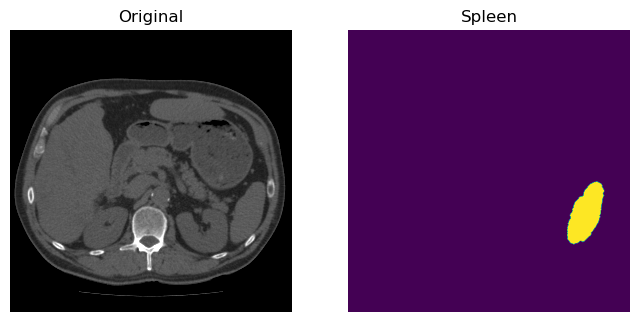

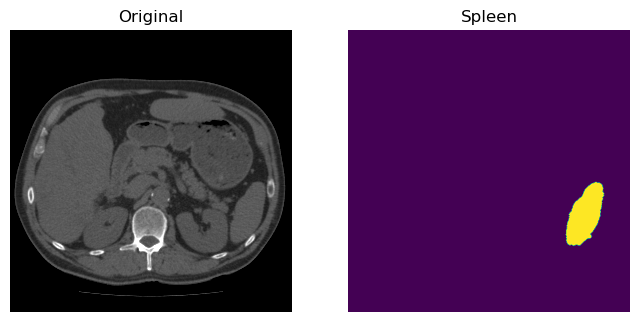

In [18]:
# Exercise 16: test fx on validation imgs
val1, val2, val3 = io.imread("data/Validation1.dcm"), io.imread("data/Validation2.dcm"), io.imread("data/Validation3.dcm")
show_comparison(img, spleen_finder(val1), 'Spleen')
show_comparison(img, spleen_finder(val2), 'Spleen')
show_comparison(img, spleen_finder(val3), 'Spleen')


In [19]:
# Exercise 17: DICE score
# Get predictions 
pred1 = spleen_finder(val1)
pred2 = spleen_finder(val2)
pred3 = spleen_finder(val3)

# get ground truths 
gt_1 = (io.imread(in_dir + 'Validation1_spleen.png') > 0)
gt_2 = (io.imread(in_dir + 'Validation2_spleen.png') > 0)
gt_3 = (io.imread(in_dir + 'Validation3_spleen.png') > 0)

# get dice scores 
score1 = 1 - distance.dice(pred1.ravel(), gt_1.ravel())
score2 = 1 - distance.dice(pred2.ravel(), gt_3.ravel())
score3 = 1 - distance.dice(pred3.ravel(), gt_3.ravel())

print(f"Score 1 = {score1}, Score 2 = {score2}, Score 3 = {score3}")

Score 1 = 0.9558359621451105, Score 2 = 0.9471671530643051, Score 3 = 0.9715459078908771


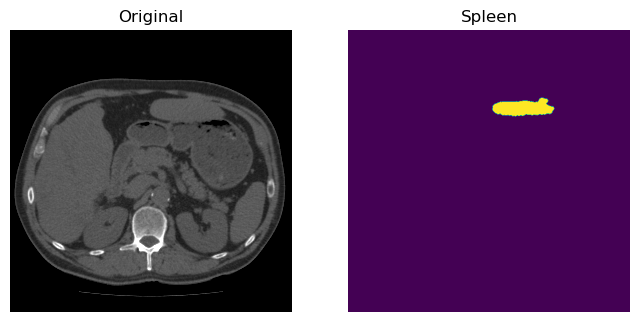

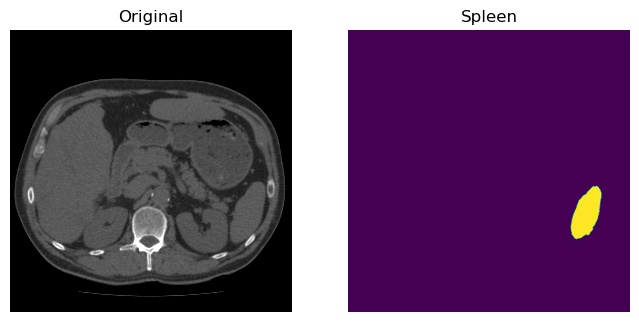

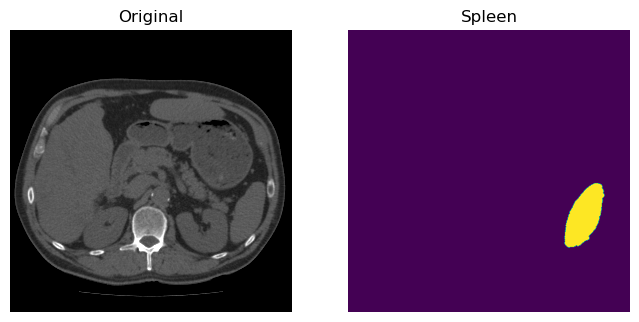

In [20]:
# Exercise 18 
test1, test2, test3 = io.imread("data/Test1.dcm"), io.imread("data/Test2.dcm"), io.imread("data/Test3.dcm")
show_comparison(img, spleen_finder(test1), 'Spleen')
show_comparison(img, spleen_finder(test2), 'Spleen')
show_comparison(img, spleen_finder(test3), 'Spleen')

## Ex6b: Advanced Pixel Classification 

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
from skimage.morphology import opening, closing
from skimage.morphology import disk

from LDA import LDA # You should have LDA.py in the same folder as the current script, otherwise you can just copy the function in the current script. 

In [62]:
in_dir = 'data/'
in_file = 'ex6_ImagData2Load.mat'
data = sio.loadmat(in_dir + in_file)
ImgT1 = data['ImgT1']
ImgT2 = data['ImgT2']
ROI_GM = data['ROI_GM'].astype(bool)
ROI_WM = data['ROI_WM'].astype(bool)

### Exercise 1

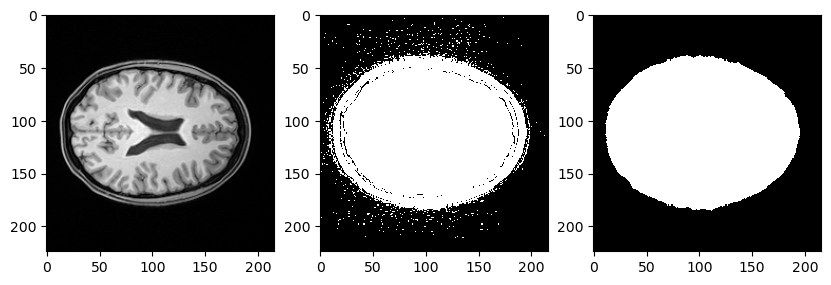

In [63]:
mask_init = ImgT1 > 10
mask = opening(mask_init, disk(2))
mask = closing(mask, disk(3))

fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (10, 10))
axs[0].imshow(ImgT1, cmap = 'gray')
axs[1].imshow(mask_init, cmap = 'gray', interpolation = 'none')
axs[2].imshow(mask, cmap = 'gray', interpolation = 'none')
plt.show()

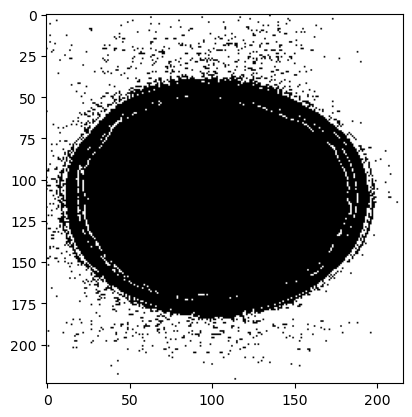

In [64]:
plt.imshow(ImgT1 < 10, cmap='gray')
plt.show()
# initial mask has many noise pixels with low intensities
# these have to be removed, so do open & close

In [65]:
def my_show_1D_histogram(img, mask, img_name, axs):
    axs[0].imshow(img, cmap = 'gray')
    axs[0].set_title(img_name)
    axs[0].set_axis_off()

    intensities = img[mask]
    axs[1].hist(intensities, bins = 100)
    axs[1].set_title(f'1D Histogram {img_name}')
    axs[1].set_xlabel('Intensities')
    axs[1].set_ylabel('Frequency')

    return intensities

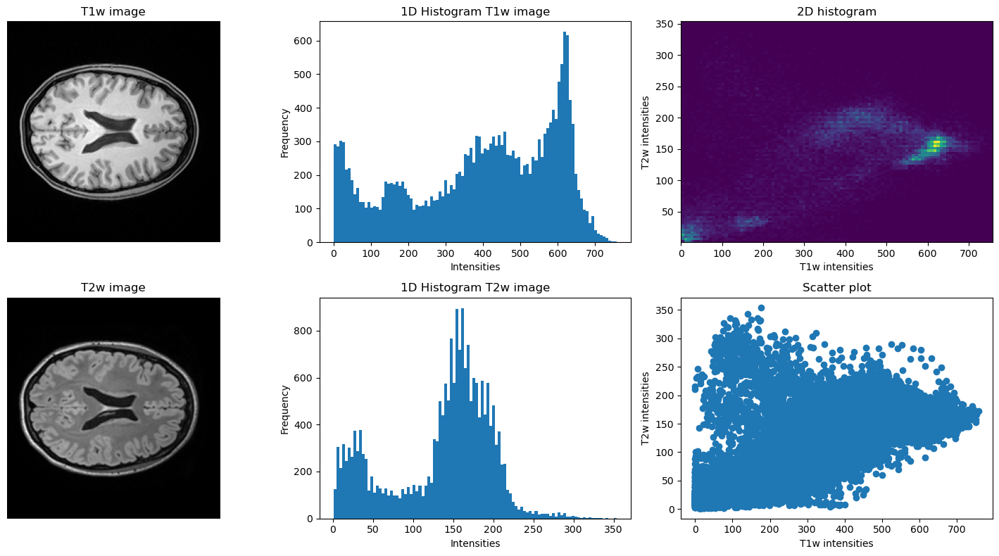

In [66]:
fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (15, 8))
T1_intensities = my_show_1D_histogram(ImgT1, mask, 'T1w image', axs[0, 0:2])
T2_intensities = my_show_1D_histogram(ImgT2, mask, 'T2w image', axs[1, 0:2])
axs[0,2].hist2d(T1_intensities, T2_intensities, bins = 100)
axs[0,2].set_xlabel('T1w intensities')
axs[0,2].set_ylabel('T2w intensities')
axs[0,2].set_title('2D histogram')

axs[1,2].scatter(T1_intensities, T2_intensities)
axs[1,2].set_xlabel('T1w intensities')
axs[1,2].set_ylabel('T2w intensities')
axs[1,2].set_title('Scatter plot')
plt.tight_layout()
plt.show()

**Q1**: What is the intensity threshold that can separate the GM and WM classes (roughly) from the 1D histograms?

A1: For T1:about 500 and for T2: about 160

**Q2**: Can the GM and WM intensity classes be observed in the 2D histogram and scatter plot? 

A2: Yes there appear clear two clusters with maxium intensitised in the 2D histogram that represent the two classes distributions 


### Exercise 2

**Q3**: Does the ROI drawings look like what you expect from an expert? 

A3: No, its just some stribes here and there in the outline the intensities of the two classes


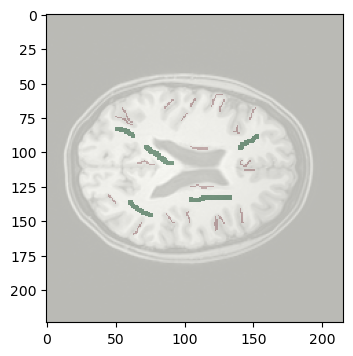

In [67]:
fig, axs = plt.subplots(nrows = 1, ncols = 1, figsize = (4, 4))
axs.imshow(ImgT1, cmap = 'gray')
axs.imshow(ROI_GM, cmap = 'Reds', alpha = 0.5, interpolation = 'none')
axs.imshow(ROI_WM, cmap = 'Greens', alpha = 0.5, interpolation = 'none')
plt.show()

### Exercise 3

**Q4**: What is the difference between the 1D histogram of the training examples and the 1D histogram of the whole image? Is the difference expected?  

A4: It looks very alike the full image histogram except for better class seperation and there is no background


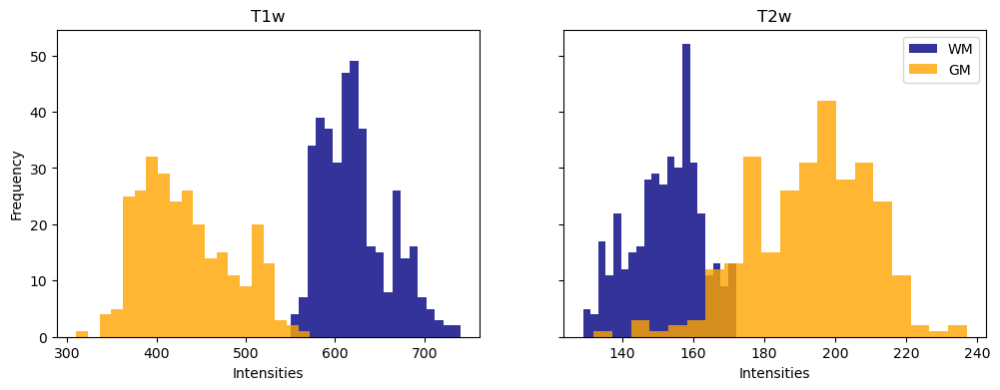

In [68]:
trainWM_T1 = ImgT1[ROI_WM] # trainWM_T1 = ImgT1[qC1[:,0], qC1[:,1]]
trainGM_T1 = ImgT1[ROI_GM] # trainGM_T1 = ImgT1[qC2[:,0], qC2[:,1]]

trainWM_T2 = ImgT2[ROI_WM] # trainWM_T2 = ImgT2[qC1[:,0], qC1[:,1]]
trainGM_T2 = ImgT2[ROI_GM] # trainGM_T2 = ImgT2[qC2[:,0], qC2[:,1]]

fig, axs = plt.subplots(1, 2, figsize = (12, 4), sharex = False, sharey = True)
axs[0].hist(trainWM_T1, bins=20, color = 'navy', label = 'WM', alpha = 0.8)
axs[0].hist(trainGM_T1, bins=20, color = 'orange', label = 'GM', alpha = 0.8)
axs[0].set_ylabel('Frequency')
axs[0].set_xlabel('Intensities')
axs[0].set_title('T1w')

axs[1].hist(trainWM_T2, bins=20, color = 'navy', label = 'WM', alpha = 0.8)
axs[1].hist(trainGM_T2, bins=20, color = 'orange', label = 'GM', alpha = 0.8)
axs[1].set_xlabel('Intensities')
axs[1].set_title('T2w')
plt.legend()
plt.show()


### Exercise 4

In [69]:
# Feature matrix, X -> Shape: (n_samples, n_features)
X1 = np.c_[ImgT1[ROI_WM], ImgT2[ROI_WM]]    # concatenance along 2nd axis 
X2 = np.c_[ImgT1[ROI_GM], ImgT2[ROI_GM]]
X = np.r_[X1, X2]    # concatenance along 1st axis 

# Label vector, T -> Shape: (n_samples)
n_pixels = X.shape[0]
n_wm_pixels = X1.shape[0]
T = np.zeros((n_pixels, 1))
T[n_wm_pixels:] = 1

In [70]:
print(X1.shape)
print(X2.shape)
print(X.shape)

(399, 2)
(280, 2)
(679, 2)


### Exercise 5

**Q5**: How does the class separation appear in the 2D scatter plot compared with 1D histogram. Is it better?

A5: The seperation between the two classes appear to be much better in 2D scatter plot


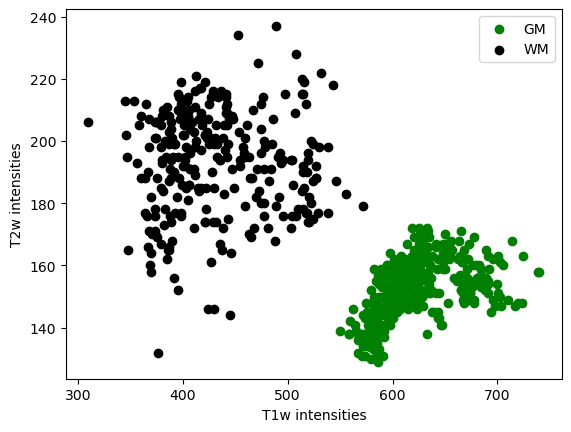

In [71]:
fig, ax = plt.subplots(1,1)
ax.scatter(X1[:,0], X1[:,1], c = 'g', label = 'GM')
ax.scatter(X2[:,0], X2[:,1], c = 'k', label = 'WM')
ax.set_xlabel('T1w intensities')
ax.set_ylabel('T2w intensities')
plt.legend()
plt.show()

### Exercise 6

In [72]:
W = LDA(X, T)
W

array([[-138.11536977,    0.27566672,    0.68044071],
       [-131.32787698,    0.15900268,    0.99568003]])

### Exercise 7

In [73]:
Xall= np.c_[ImgT1[mask].flatten(), ImgT2[mask].flatten()]
Y = np.c_[np.ones((len(Xall), 1)), Xall] @ W.T

### Exercise 8

In [74]:
PosteriorProb = np.clip(np.exp(Y) / np.sum(np.exp(Y),1)[:,np.newaxis], 0, 1)

### Exercise 9

In [75]:
posteriorC1 = np.zeros(ImgT1.shape)
posteriorC2 = np.zeros(ImgT1.shape)

posteriorC1[mask] = PosteriorProb[:,0]
posteriorC2[mask] = PosteriorProb[:,1]
mask_WM = posteriorC1 >= 0.5
mask_GM = posteriorC2 > 0.5

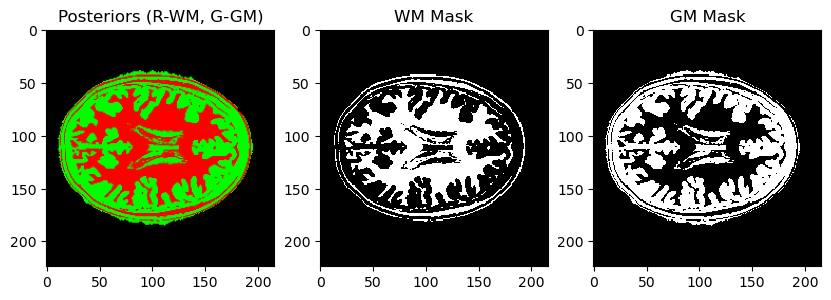

In [76]:
fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (10, 5))
rgb = np.stack((posteriorC1, posteriorC2, np.zeros_like(posteriorC1)), axis = -1).astype(np.double)
axs[0].imshow(rgb)
axs[0].set_title('Posteriors (R-WM, G-GM)')
axs[1].imshow(mask_WM, cmap = 'gray', interpolation = 'none')
axs[1].set_title('WM Mask')
axs[2].imshow(mask_GM, cmap='gray', interpolation = 'none')
axs[2].set_title('GM Mask')
plt.show()

### Exercise 10

**Q6**: Can you identify where the hyper plan is placed i.e. y(x)=0? 

A6: Yes, all the segmented points show a clear line at their
       interface=Hyperplane

**Q7**: Is the linear hyper plane positioned as you expected or would a non-linear hyperplane perform better?

A7: Yes and no - I would expect all black and green training data
       points to be on each side of the hyperplane. Moreover the hyperplane seems
       to be too linear and there seem to be an extras class at the low image
       resolutions. 

**Q8**: Would segmentation be as good as using a single image modality using
    thresholding?

A8: If that should be the case the hyperplane would be orthogonal to one
       of the features. It is not. So no.

**Q9**: From the scatter plot does the segmentation results make sense? Are the two tissue types segmented correctly .

A9: Looks good, but hard to say from a scatter plot


In [77]:
Xall_WM = Xall[PosteriorProb[:,0] > 0.5, :]
Xall_GM = Xall[PosteriorProb[:,1] > 0.5, :]

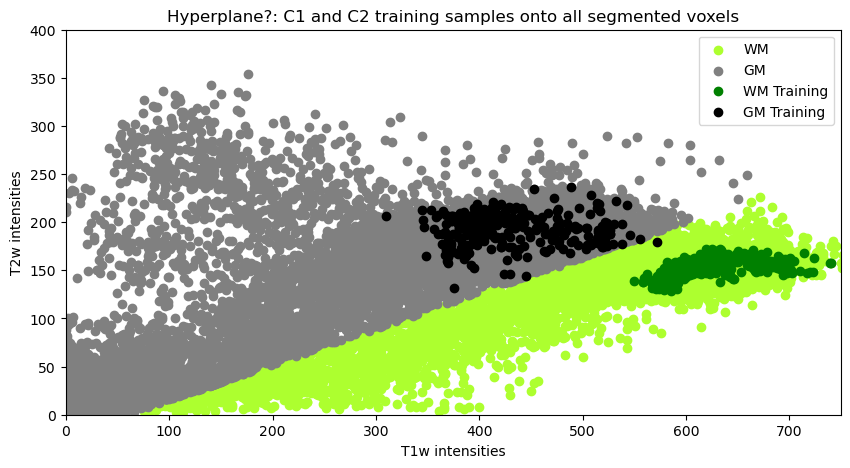

In [78]:
fig, ax = plt.subplots(1,1, figsize = (10,5))
ax.scatter(Xall_WM[:,0], Xall_WM[:,1], c = 'greenyellow', label = 'WM')
ax.scatter(Xall_GM[:,0], Xall_GM[:,1], c = 'gray', label = 'GM')
ax.scatter(X1[:,0], X1[:,1], c = 'g', label = 'WM Training')
ax.scatter(X2[:,0], X2[:,1], c = 'k', label = 'GM Training')
ax.set_xlabel('T1w intensities')
ax.set_ylabel('T2w intensities')
ax.set_title('Hyperplane?: C1 and C2 training samples onto all segmented voxels')

plt.axis([0, 750, 0, 400])
plt.legend()
plt.show()

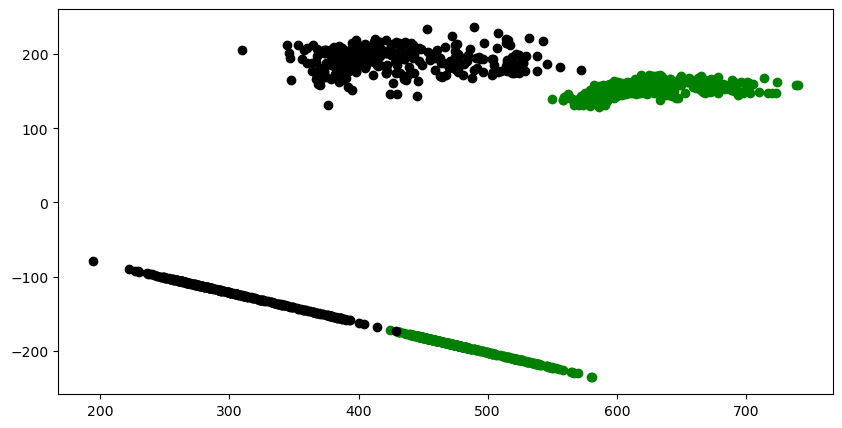

In [79]:
# Projection of the training data onto the hyperplane

fig, ax = plt.subplots(1,1, figsize = (10,5))
ax.scatter(X1[:,0], X1[:,1], c = 'g', label = 'GM Training')
ax.scatter(X2[:,0], X2[:,1], c = 'k', label = 'WM Training')
W_ = W[0,1:] # The weights indicate the normal to the hyperplane, for the projection we need the perpendicular
W_ = (W_/np.linalg.norm(W_))[::-1]
W_[0] = -W_[0]
for point in X1:
    proj = np.dot(point,W_)/np.dot(W_,W_) * W_
    ax.scatter(proj[0],proj[1],color='g')

for point in X2:
    proj = np.dot(point,W_)/np.dot(W_,W_) * W_
    ax.scatter(proj[0],proj[1],color='k')

# W_ = W[1,1:] # The weights indicate the normal to the hyperplane, for the projection we need the perpendicular
# W_ = (W_/np.linalg.norm(W_))[::-1]
# W_[0] = -W_[0]
# for point in X1:
#   proj = np.dot(point,W_)/np.dot(W_,W_) * W_
#   ax.scatter(proj[0],proj[1],color='r')

# for point in X2:
#   proj = np.dot(point,W_)/np.dot(W_,W_) * W_
#   ax.scatter(proj[0],proj[1],color='b')

### Exercise 11

**Q10**: Are the training examples representative for the segmentation results? Are you surprised that so few training examples perform so well? Do you need to be an anatomical expert to draw these?

A10: Yes they are representative. Yes and no; one do not need to be an anatomical expert, but you need to understand what the method needs as input to perform well.

**Q11**: Compare the segmentation results with the original image. Is the segmentation results satisfactory? Why not?

A11: Yes, the WM and GM classes looks correct segmented when comparing to the anatomical structures in ImgT1 and ImgT2.

**Q12**: Is one class completely wrong segmented? What is the problem?

A12: Yes - If you have not masked out the backgroud voxels, all background and skull voxels also are classified as GM. Solution is to identify the background voxels and exclude these from the segmentation or to add an extra class for background/skull voxels. Also the CSF class is segmented as both GM and WM. The segmentation problem is that there are more classes in the image than the classifier has been trained to segment.


In [80]:
tmp = np.zeros(mask_WM.shape)
red_WM = np.stack((mask_WM, tmp, tmp), axis = -1)
green_GM = np.stack((tmp, mask_GM, tmp), axis = -1)

In [81]:
def overlay_segmentation(I, M):
    I = I/I.max()
    I_aux, I_red = I.copy(), I.copy()
    I_aux[M] = 0
    I_red[M] = 1
    tmp = np.stack((I_red, I_aux, I_aux), axis = -1)
    return tmp

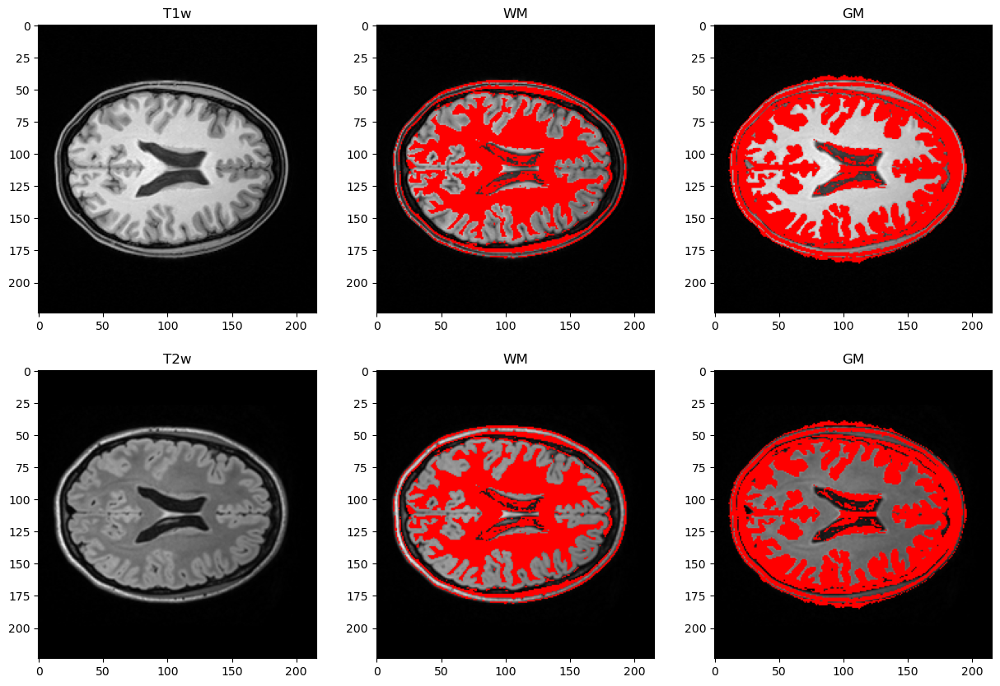

In [82]:
fig, axs = plt.subplots(2, 3, figsize = (15, 10))
axs[0,0].imshow(ImgT1, cmap = 'gray')
axs[0,0].set_title('T1w')
axs[0,1].imshow(overlay_segmentation(ImgT1, mask_WM))
axs[0,1].set_title('WM')
axs[0,2].imshow(overlay_segmentation(ImgT1, mask_GM))
axs[0,2].set_title('GM')

axs[1,0].imshow(ImgT2, cmap = 'gray')
axs[1,0].set_title('T2w')
axs[1,1].imshow(overlay_segmentation(ImgT2, mask_WM))
axs[1,1].set_title('WM')
axs[1,2].imshow(overlay_segmentation(ImgT2, mask_GM))
axs[1,2].set_title('GM')

plt.show()

## Ex7: Geometric transformations and landmark based registration

In [17]:
import matplotlib.pyplot as plt
from math import pi
import numpy as np
from skimage import io, img_as_float
from skimage.transform import rotate, EuclideanTransform, SimilarityTransform, \
    warp, swirl, matrix_transform 

In [18]:
def show_comparison(original, transformed, transformed_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4), sharex=True,
                                   sharey=True)
    ax1.imshow(original)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(transformed)
    ax2.set_title(transformed_name)
    ax2.axis('off')
    io.show()

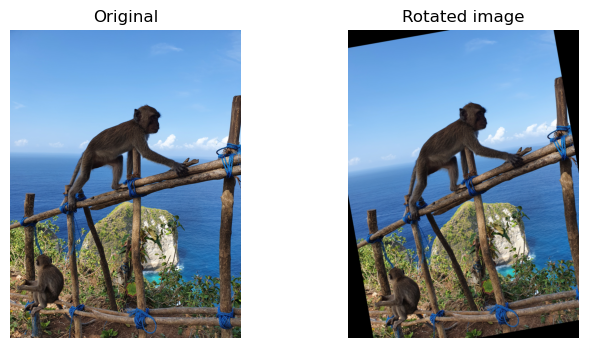

In [19]:
# exercise 1: rotate an image
img_dir = "data/"
img_name = 'NusaPenida.png'
im_org = io.imread(img_dir + img_name)
# angle in degrees - counter clockwise
rotation_angle = 10
rotated_img = rotate(im_org, rotation_angle)
show_comparison(im_org, rotated_img, "Rotated image")

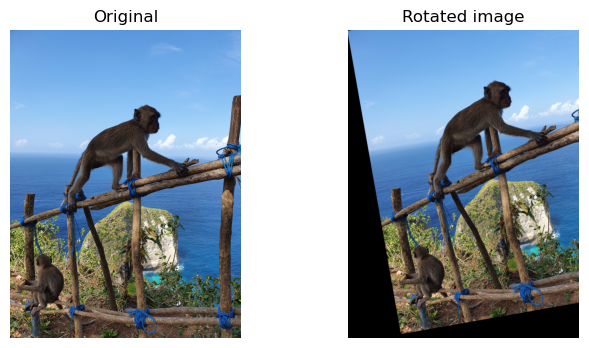

In [20]:
# specify centre of rotation
rot_center = [10, 10]
rotated_img = rotate(im_org, rotation_angle, center=rot_center)
show_comparison(im_org, rotated_img, "Rotated image")

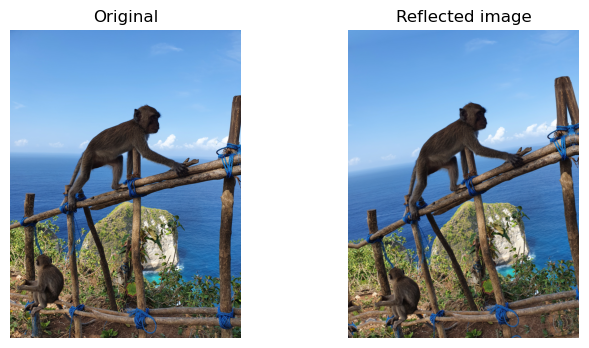

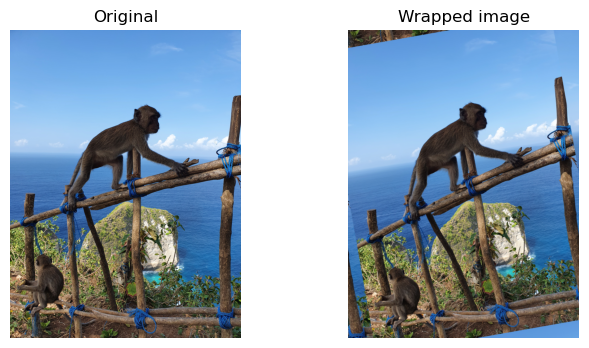

In [21]:
# exercise 2: rotate and fill with reflect
rot_center = [0, 0]
rotated_img = rotate(im_org, rotation_angle, mode="reflect")
show_comparison(im_org, rotated_img, "Reflected image")

# exercise 3: rotate and fill with wrap
rotated_img = rotate(im_org, rotation_angle, mode="wrap")
show_comparison(im_org, rotated_img, "Wrapped image")

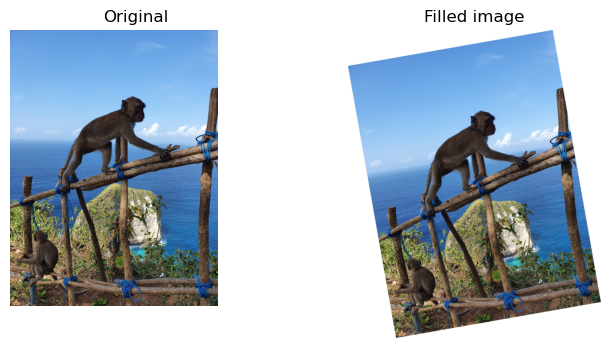

In [22]:
# exercise 4: rotate and fill with constant
rotated_img = rotate(im_org, rotation_angle, resize=True, mode="constant", 
                     cval=1)
show_comparison(im_org, rotated_img, "Filled image")

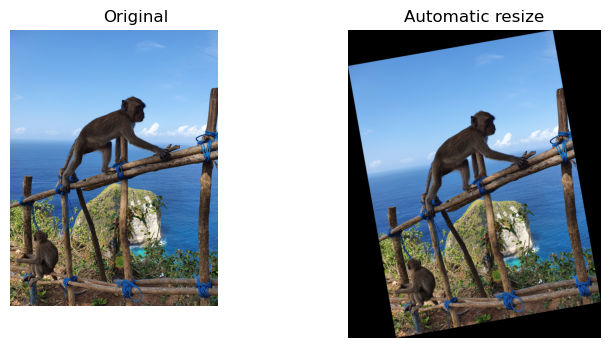

In [23]:
# exercise 5: automatic resizing rotated img to fit frame
rotated_img = rotate(im_org, rotation_angle, resize=True)
show_comparison(im_org, rotated_img, "Automatic resize")

In [24]:
# exercise 6: euclidean image transformation
# angle in radians - counter clockwise
rotation_angle = 10.0 * pi / 180.
trans = [10, 20]
tform = EuclideanTransform(rotation=rotation_angle, translation=trans)
print(tform.params)

[[ 0.98480775 -0.17364818 10.        ]
 [ 0.17364818  0.98480775 20.        ]
 [ 0.          0.          1.        ]]


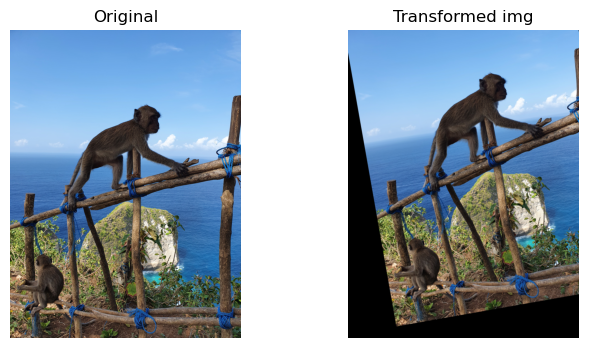

In [25]:
# exercise 7
transformed_img = warp(im_org, tform)
show_comparison(im_org, transformed_img, "Transformed img")

[[ 0.98480775 -0.17364818  0.        ]
 [ 0.17364818  0.98480775  0.        ]
 [ 0.          0.          1.        ]]


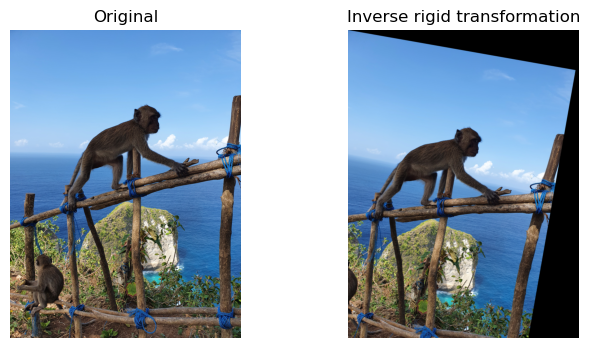

In [35]:
# exercise 8: Euclidean transformation with rotation only
rotation_angle = 10.0 * pi / 180.
tform = EuclideanTransform(rotation=rotation_angle)
print(tform.params)
transformed_img = warp(im_org, tform.inverse)   # inverse transformation
show_comparison(im_org, transformed_img, "Inverse rigid transformation")

[[ 0.5795555  -0.15529143 40.        ]
 [ 0.15529143  0.5795555  30.        ]
 [ 0.          0.          1.        ]]


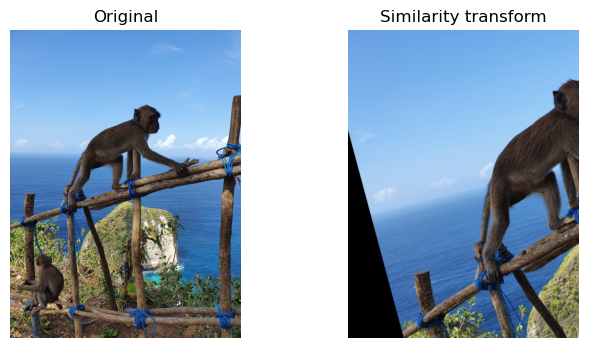

In [36]:
# exercise 9: Similarity transform
rotation_angle = 15.0 * pi / 180.
trans = [40, 30]
scaling=0.6
tform = SimilarityTransform(rotation=rotation_angle,
                            translation=trans,scale=scaling)
print(tform.params)
transformed_img = warp(im_org, tform)   # inverse transformation
show_comparison(im_org, transformed_img, "Similarity transform")

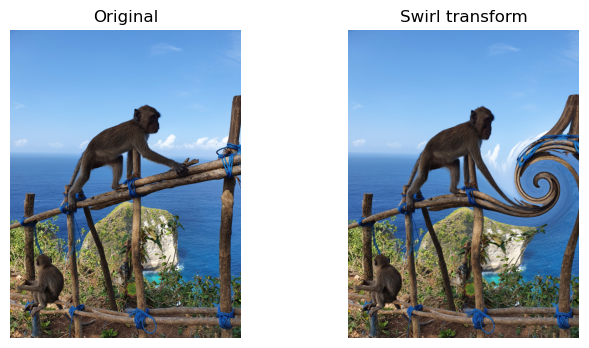

In [28]:
# exercise 10: swirl img transform
strength = 10
rad = 300
c = [500, 400]
swirl_img = swirl(im_org, strength=strength, radius=rad, center=c)
show_comparison(im_org, swirl_img, "Swirl transform")

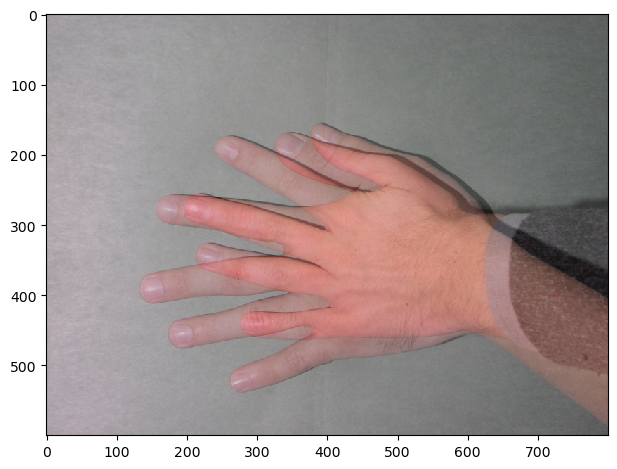

In [29]:
# exercise 11: landmark based registration

src_img = io.imread(img_dir + 'Hand1.jpg')
dst_img = io.imread(img_dir + 'Hand2.jpg')

blend = 0.5 * img_as_float(src_img) + 0.5 * img_as_float(dst_img)
io.imshow(blend)
io.show()

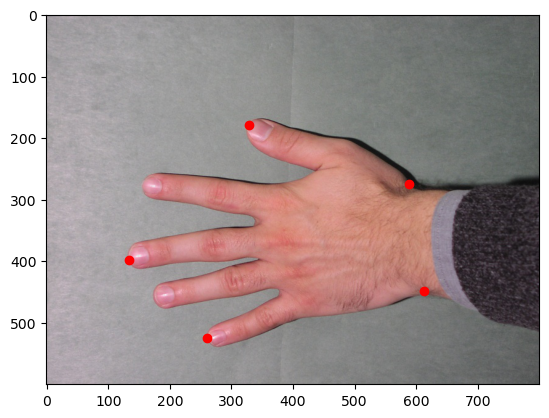

In [30]:
# exercise 12: manual landmark registration
src = np.array([[588, 274], [328, 179], [134, 398], 
                [260, 525], [613, 448]])

plt.imshow(src_img)
plt.plot(src[:, 0], src[:, 1], '.r', markersize=12)
plt.show()

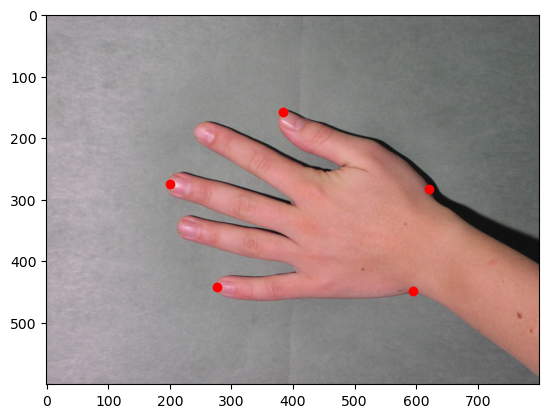

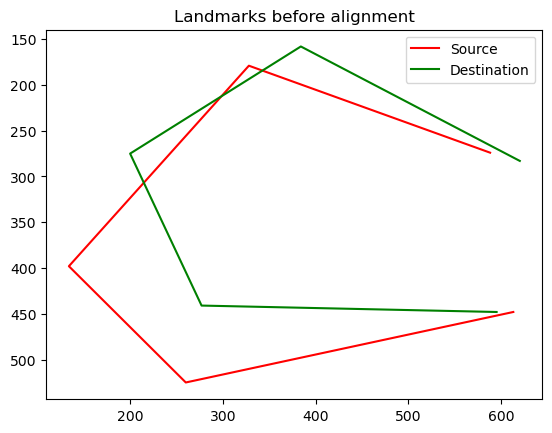

In [31]:
# exercise 13: from ex7_ex13.py
dst = np.array([[620, 283],[384, 158],[200, 275],
                [277, 441],[595, 448]])

plt.imshow(dst_img)
plt.plot(dst[:, 0], dst[:, 1], '.r', markersize=12)
plt.show()

fig, ax = plt.subplots()

ax.plot(src[:, 0], src[:, 1], '-r', markersize=12, label="Source")
ax.plot(dst[:, 0], dst[:, 1], '-g', markersize=12, label="Destination")
ax.invert_yaxis()
ax.legend()
ax.set_title("Landmarks before alignment")
plt.show()

In [32]:
# exercise 14: compute objective function (sum of squared error)
e_x = src[:, 0] - dst[:, 0]
error_x = np.dot(e_x, e_x)
e_y = src[:, 1] - dst[:, 1]
error_y = np.dot(e_y, e_y)
f = error_x + error_y
print(f"Landmark alignment error F: {f}")

# find optimal transform of src points/landmarks
tform = EuclideanTransform()
tform.estimate(src, dst)
src_transform = matrix_transform(src, tform.params)
print(src_transform)

Landmark alignment error F: 31836
[[634.51454695 282.04708617]
 [405.17995941 127.02887126]
 [164.00471164 292.65344632]
 [255.57782045 446.33937847]
 [616.72296155 456.93121778]]


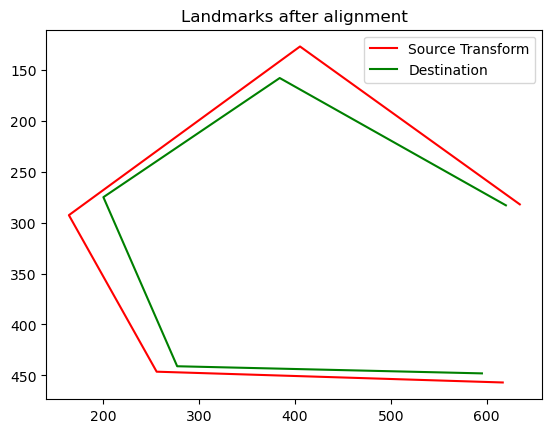

Landmark alignment error F: 4265.75901388823


In [33]:
# exercise 15: recompute objective function

fig, ax = plt.subplots()
ax.plot(src_transform[:, 0], src_transform[:, 1], '-r', markersize=12, label="Source Transform")
ax.plot(dst[:, 0], dst[:, 1], '-g', markersize=12, label="Destination")
ax.invert_yaxis()
ax.legend()
ax.set_title("Landmarks after alignment")
plt.show()

e_x = src_transform[:, 0] - dst[:, 0]
error_x = np.dot(e_x, e_x)
e_y = src_transform[:, 1] - dst[:, 1]
error_y = np.dot(e_y, e_y)
f = error_x + error_y
print(f"Landmark alignment error F: {f}")

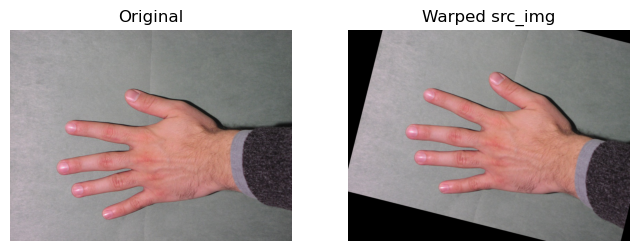

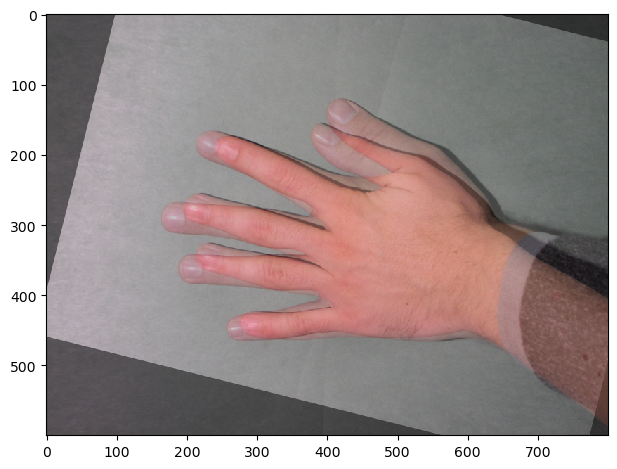

In [34]:
# exercise 16: apply transformation to src img
warped = warp(src_img, tform.inverse)
show_comparison(src_img, warped, "Warped src_img")

blend = 0.5 * img_as_float(warped) + 0.5 * img_as_float(dst_img)
io.imshow(blend)
io.show()